In [1]:
############# Mountiong Google Drive and Changing Working Directory PATH to Dataset Directory PATH ##################

from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [2]:
!unzip "/content/drive/MyDrive/Bone_Fracture/Bone_Fracture.zip"

Archive:  /content/drive/MyDrive/Bone_Fracture/Bone_Fracture.zip
   creating: Bone_Fracture/
   creating: Bone_Fracture/Bone_Fracture/
   creating: Bone_Fracture/Bone_Fracture/Negative/
  inflating: Bone_Fracture/Bone_Fracture/Negative/image (1).png  
  inflating: Bone_Fracture/Bone_Fracture/Negative/image (1009).png  
  inflating: Bone_Fracture/Bone_Fracture/Negative/image (1047).png  
  inflating: Bone_Fracture/Bone_Fracture/Negative/image (1061).png  
  inflating: Bone_Fracture/Bone_Fracture/Negative/image (1197).png  
  inflating: Bone_Fracture/Bone_Fracture/Negative/image (1198).png  
  inflating: Bone_Fracture/Bone_Fracture/Negative/image (1199).png  
  inflating: Bone_Fracture/Bone_Fracture/Negative/image (1214).png  
  inflating: Bone_Fracture/Bone_Fracture/Negative/image (1234).png  
  inflating: Bone_Fracture/Bone_Fracture/Negative/image (1235).png  
  inflating: Bone_Fracture/Bone_Fracture/Negative/image (1236).png  
  inflating: Bone_Fracture/Bone_Fracture/Negative/image (1

In [3]:
directory_path = "/content/Bone_Fracture"

################# Changing the Working Directory Path ################## 
import os
os.chdir(directory_path)
!ls

Bone_Fracture  train_test_split


In [4]:
import os
os.chdir("{}/Bone_Fracture/Positive".format(directory_path))
!ls


'04085901 masked.png'	  '2018-315AP masked.png'   '2018-672AP masked.png'
'100a masked.png'	  '2018 315 L masked.png'   '2018-672L masked.png'
'100 masked.png'	  '2018 316 AP masked.png'  '2018-675AP masked.png'
'102a masked.png'	  '2018-316AP masked.png'   '2018-676AP masked.png'
'102 masked.png'	  '2018 316 L masked.png'   '2018-676L masked.png'
'103a masked.png'	  '2018-316L masked.png'    '2018-677L masked.png'
'104 masked.png'	  '2018 317 AP masked.png'  '2018-679AP masked.png'
'105a masked.png'	  '2018-317AP masked.png'   '2018-679L masked.png'
'105 masked.png'	  '2018 317 L masked.png'   '2018 67 AP masked.png'
'106a masked.png'	  '2018 318 AP masked.png'  '2018-67AP masked.png'
'107a masked.png'	  '2018-318AP masked.png'   '2018 67 L masked.png'
'107 masked.png'	  '2018-319AP masked.png'   '2018-681AP masked.png'
'108a masked.png'	  '2018 319 L masked.png'   '2018-682L masked.png'
'108 masked.png'	  '2018-31AP masked.png'    '2018-683AP masked.png'
'109a masked.png'	  '2018 31 

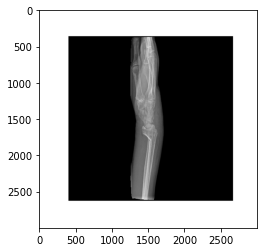

 Actual Image Shape is : (3000, 3000, 4)


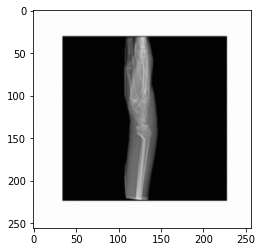

 New Resized Image Shape is : (256, 256, 4)


In [5]:
#################### Showing One Image of Bone and its resized image as well ##################

import numpy as np
import cv2
from scipy import ndimage
from skimage import io
from skimage.transform import rotate
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow
from skimage.color import rgb2hsv
import glob
import os
from skimage.transform import resize

import os
os.chdir("{}/Bone_Fracture/Positive".format(directory_path))

############# Code for Cropping, Rotating and 1 Image ###################
tmp_path = "100a masked.png" 
tmp_img = io.imread(tmp_path)
plt.imshow(tmp_img)
plt.show()
print(" Actual Image Shape is :", tmp_img.shape)

resized_img  = resize(tmp_img, (256,256,4), anti_aliasing=True, order=1)
plt.imshow(resized_img)
plt.show()

print(" New Resized Image Shape is :", resized_img.shape)


In [6]:
#################### Making a Numpy Array from All Bone images to train the network ####################


all_bone_images_directory_path = "{}/Bone_Fracture/Positive".format(directory_path)
all_bone_images_paths = glob.glob('{}/*.png'.format(all_bone_images_directory_path) )
print(len(all_bone_images_paths))


bone_images_array_data = np.zeros((len(all_bone_images_paths[:300]), 256,256,4))

for i, tmp_img_path in enumerate(all_bone_images_paths[:300]):

  print("Adding {} Bone Image to Numpy Array".format ( os.path.basename(tmp_img_path)) )
  try:
    tmp_img = io.imread(tmp_img_path)
  except:
    continue

  tmp_img_resized = resize(tmp_img, (256, 256,4))

  bone_images_array_data[i,] = tmp_img_resized

np.save("bone_images_array_data.npy",bone_images_array_data)

1976
Adding 2018-401AP masked.png Bone Image to Numpy Array
Adding 22a masked.png Bone Image to Numpy Array
Adding 2018-369L masked.png Bone Image to Numpy Array
Adding 2018 444 L masked.png Bone Image to Numpy Array
Adding 2018-512L masked.png Bone Image to Numpy Array
Adding 40a masked.png Bone Image to Numpy Array
Adding 345L masked.png Bone Image to Numpy Array
Adding 2018-312L masked.png Bone Image to Numpy Array
Adding 107 masked.png Bone Image to Numpy Array
Adding 108a masked.png Bone Image to Numpy Array
Adding 2019-231L masked.png Bone Image to Numpy Array
Adding 189a masked.png Bone Image to Numpy Array
Adding 2021-363A masked.png Bone Image to Numpy Array
Adding 310 masked.png Bone Image to Numpy Array
Adding 188 masked.png Bone Image to Numpy Array
Adding 2019-53AP masked.png Bone Image to Numpy Array
Adding 2018 39 AP masked.png Bone Image to Numpy Array
Adding 148a masked.png Bone Image to Numpy Array
Adding 2018-31AP masked.png Bone Image to Numpy Array
Adding 2018-362A

In [7]:
##################### Defining Auto-Encoder Architecture ###################################

import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

from tensorflow.keras import layers
#from tensorflow.keras.datasets import mnist
from tensorflow.keras.models import Model

input = layers.Input(shape=(256, 256, 4))

################## Making U-Net Like Covolutional Auto-Encoder Architecture ###################

###### Defining Encoder Model Architecture ################ 
down_Sampling_Stage_1 = layers.Conv2D(32, (3, 3), activation="relu", padding="same")(input)
x1 = layers.MaxPooling2D((2, 2), padding="same")(down_Sampling_Stage_1)
x2 = layers.BatchNormalization()(x1)
down_Sampling_Stage_2 = layers.Conv2D(64, (3, 3), activation="relu", padding="same")(x2)
x3 = layers.MaxPooling2D((2, 2), padding="same")(down_Sampling_Stage_2)
x4 = layers.BatchNormalization()(x3)
down_Sampling_Stage_3 = layers.Conv2D(128, (3, 3), activation="relu", padding="same")(x4)
x5 = layers.MaxPooling2D((2, 2), padding="same")(down_Sampling_Stage_3)
x6 = layers.BatchNormalization()(x5)
down_Sampling_Stage_4 = layers.Conv2D(256, (3, 3), activation="relu", padding="same")(x6)
x7 = layers.MaxPooling2D((2, 2), padding="same")(down_Sampling_Stage_4)
x8 = layers.BatchNormalization()(x7)
down_Sampling_Stage_5 = layers.Conv2D(512, (3, 3), activation="relu", padding="same")(x8)
x9 = layers.MaxPooling2D((2, 2), padding="same")(down_Sampling_Stage_5)
x10 = layers.BatchNormalization()(x9)
down_Sampling_Stage_6 = layers.Conv2D(1024, (3, 3), activation="relu", padding="same")(x10)
x11 = layers.MaxPooling2D((2, 2), padding="same")(down_Sampling_Stage_6)

###### Defining Decoder Model Architecture ################ 
x12 = layers.Conv2DTranspose(1024, (3, 3), strides=2, activation="relu", padding="same")(x11)
x13 = layers.BatchNormalization()(x12)
x14 = layers.Concatenate()([x13, down_Sampling_Stage_6])
x15 = layers.Conv2DTranspose(512, (3, 3), strides=2, activation="relu", padding="same")(x14)
x16 = layers.BatchNormalization()(x15)
x17 = layers.Concatenate()([x16, down_Sampling_Stage_5])
x18 = layers.Conv2DTranspose(256, (3, 3), strides=2, activation="relu", padding="same")(x17)
x19 = layers.BatchNormalization()(x18)
x20 = layers.Concatenate()([x19, down_Sampling_Stage_4])
x21 = layers.Conv2DTranspose(128, (3, 3), strides=2, activation="relu", padding="same")(x20)
x22 = layers.BatchNormalization()(x21)
x23 = layers.Concatenate()([x22, down_Sampling_Stage_3])
x24 = layers.Conv2DTranspose(64, (3, 3), strides=2, activation="relu", padding="same")(x23)
x25 = layers.BatchNormalization()(x24)
x26 = layers.Concatenate()([x25, down_Sampling_Stage_2])
x27 = layers.Conv2DTranspose(32, (3, 3), strides=2, activation="relu", padding="same")(x26)
x28 = layers.BatchNormalization()(x27)
x29 = layers.Concatenate()([x28, down_Sampling_Stage_1])
x30 = layers.Conv2D(4, (3, 3), activation="sigmoid", padding="same")(x29)

# Autoencoder
autoencoder = Model(input, x30)
autoencoder.compile(optimizer="adam", loss="mse")
print("Showing Auto-Encoder Model Architecture: ")
print(autoencoder.summary())


Showing Auto-Encoder Model Architecture: 
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 4  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 32  1184        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 max_pooling2d (MaxPooling2D)   (None, 128, 128, 32  0           ['conv2d[0][0]']                 
                                )                   

Epoch 1/20
26/26 - 22s - loss: 0.0453 - val_loss: 0.0361 - 22s/epoch - 837ms/step
Epoch 2/20
26/26 - 4s - loss: 0.0013 - val_loss: 0.0265 - 4s/epoch - 160ms/step
Epoch 3/20
26/26 - 4s - loss: 5.0808e-04 - val_loss: 0.0204 - 4s/epoch - 161ms/step
Epoch 4/20
26/26 - 4s - loss: 4.3750e-04 - val_loss: 0.0155 - 4s/epoch - 162ms/step
Epoch 5/20
26/26 - 4s - loss: 3.4787e-04 - val_loss: 0.0102 - 4s/epoch - 161ms/step
Epoch 6/20
26/26 - 4s - loss: 3.0689e-04 - val_loss: 0.0075 - 4s/epoch - 162ms/step
Epoch 7/20
26/26 - 4s - loss: 2.9097e-04 - val_loss: 0.0056 - 4s/epoch - 162ms/step
Epoch 8/20
26/26 - 4s - loss: 2.0896e-04 - val_loss: 0.0042 - 4s/epoch - 163ms/step
Epoch 9/20
26/26 - 4s - loss: 2.0736e-04 - val_loss: 0.0033 - 4s/epoch - 164ms/step
Epoch 10/20
26/26 - 4s - loss: 1.9799e-04 - val_loss: 0.0025 - 4s/epoch - 165ms/step
Epoch 11/20
26/26 - 4s - loss: 1.8313e-04 - val_loss: 0.0021 - 4s/epoch - 164ms/step
Epoch 12/20
26/26 - 4s - loss: 1.9530e-04 - val_loss: 0.0015 - 4s/epoch - 165ms/

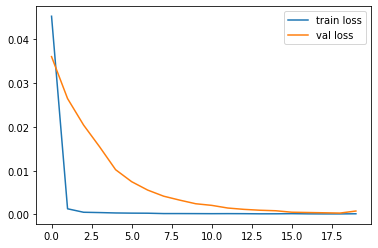

In [8]:
##################### Training Auto-Encoder Model with Given Dataset Images ############################

from sklearn.model_selection import train_test_split
from matplotlib import pyplot as plt

X_train, X_test, y_train, y_test = train_test_split(bone_images_array_data, bone_images_array_data, test_size=0.33, random_state=42)

history = autoencoder.fit(X_train,y_train,
                          epochs=20, batch_size=8,
                          validation_data=(X_test, y_test),
                          verbose = 2)

model_path = "{}/autoencoder.h5".format(directory_path)
print("Saving Autoencoder Model for Later Use..")
autoencoder.save(model_path)
print("Autoencoder Model Saved.")


print("Showing Training and Validation Losses Graph:")
plt.plot(history.history['loss'], label='train loss')
plt.plot(history.history['val_loss'], label='val loss')
plt.legend()
plt.show()



In [16]:
################## Findind Test Accuracy on Positive Bone Images ###############
import keras 
import tensorflow as tf

########## Getting Predictions from trained Auto-Encoder Model ######################

output = autoencoder.predict(X_test)


############# Fiding the loss Between Actual Positive Bone Images and Predicted Bone Images #################
mse_loses= tf.keras.metrics.mean_squared_error(y_test, output)
print(mse_loses.shape)
mse_loses= tf.reduce_sum(mse_loses, axis=-1)
mse_loses= tf.reduce_sum(mse_loses, axis=-1)
print("Individual Losses Between Actual Positive Bone Images and Predicted Bone Images: ", mse_loses)

mse_loss_threshod = 97

predicted_class = mse_loses <= mse_loss_threshod

actual_test_labels = np.ones(y_test.shape[0])

from sklearn.metrics import accuracy_score

model_accuracy = accuracy_score(actual_test_labels, predicted_class)
print("Auto-Encoder Model Accuracy on Test Images is : ", model_accuracy, " OR ", model_accuracy*100, "%" )

(99, 256, 256)
Individual Losses Between Actual Positive Bone Images and Predicted Bone Images:  tf.Tensor(
[ 43.08634   28.84361   44.462208  55.08448   43.796944  38.348675
  61.791622  41.627293  37.07495   83.03184   60.99765   61.5795
  34.666843  92.46514   56.310753  60.67581   41.237328  39.22213
  46.864098  76.2233    41.75341   30.59022   66.158264  64.60877
  38.854477  90.97286   59.49528   36.85418   62.82067   30.713108
  41.545612  33.943935  49.24041   49.674473  59.551743  41.789658
  30.110405  88.906044  47.06814   47.36585   72.177734  56.909424
  60.860935  37.415596  35.480797  55.6028    42.67087   59.38495
  37.912052  28.975864  72.14763   61.680878  51.003464  48.432217
  34.351715  97.348495  38.64317   54.97048   41.377655  49.99193
  50.44245   30.846626  56.017853  65.71904   32.75084   42.816338
  44.85032   66.27023   50.287067  60.186153  33.773132  52.118813
  67.8775    38.69024   41.46955   46.12874   56.52904   41.785156
  61.15605   41.274147  38.

In [17]:
def dice_coeff(y_true, y_pred):
    smooth = 1.
    # Flatten
    y_true = tf.cast (y_true, dtype= tf.float64)
    y_pred = tf.cast (y_pred, dtype= tf.float64)
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)
    return score

Actual Image: 


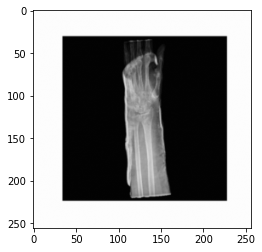

Predicted Image: 


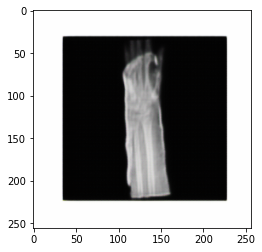

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


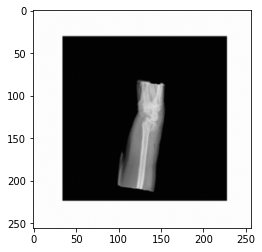

Predicted Image: 


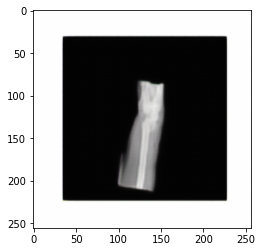

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


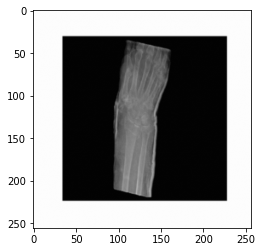

Predicted Image: 


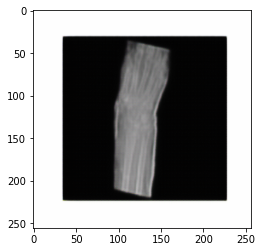

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


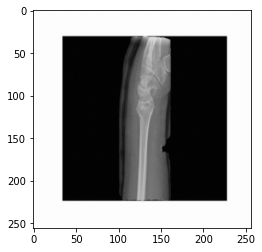

Predicted Image: 


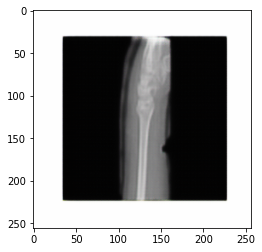

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


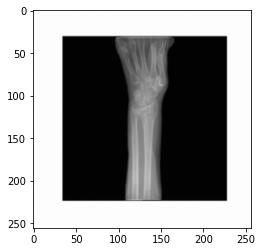

Predicted Image: 


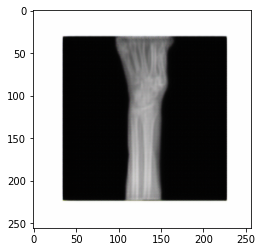

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


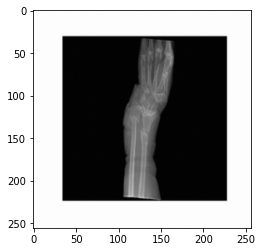

Predicted Image: 


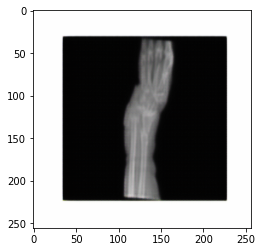

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


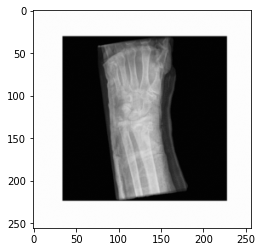

Predicted Image: 


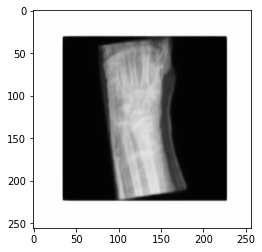

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


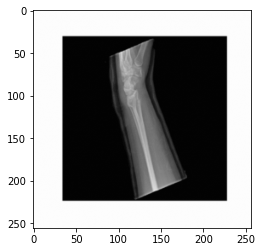

Predicted Image: 


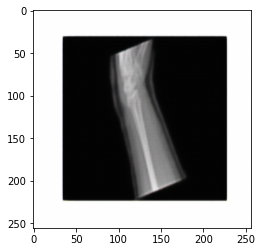

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


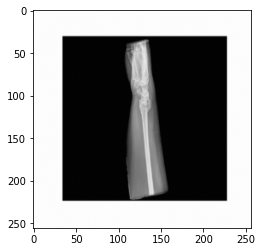

Predicted Image: 


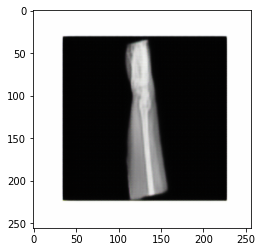

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


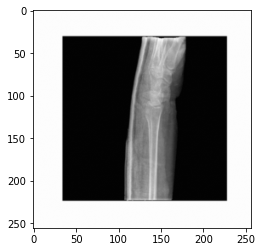

Predicted Image: 


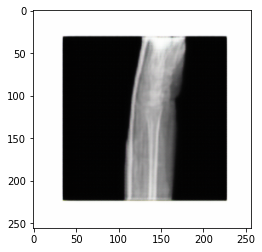

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


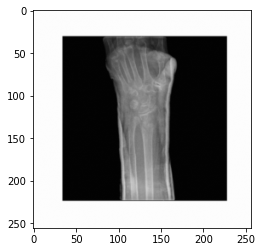

Predicted Image: 


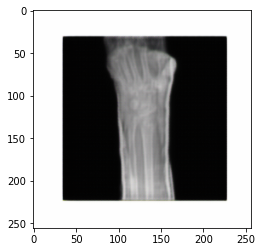

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


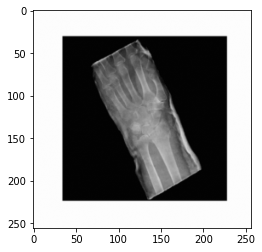

Predicted Image: 


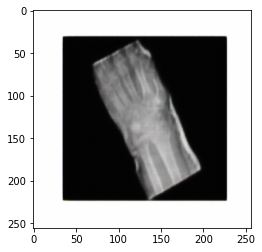

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


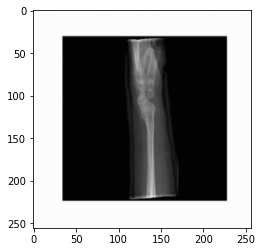

Predicted Image: 


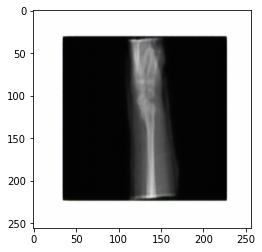

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


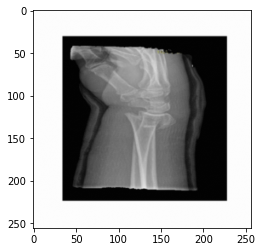

Predicted Image: 


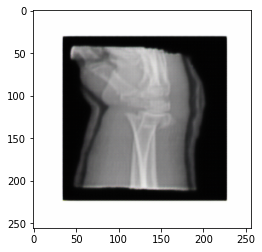

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


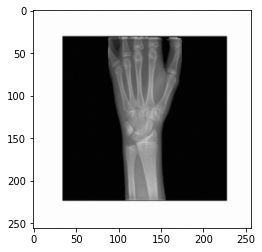

Predicted Image: 


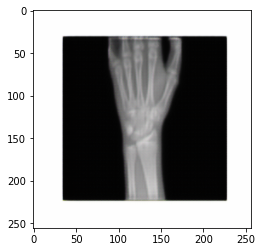

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


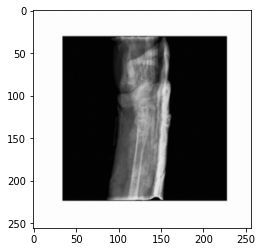

Predicted Image: 


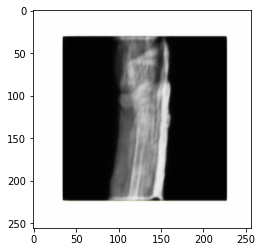

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


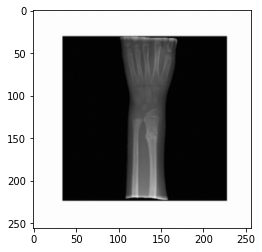

Predicted Image: 


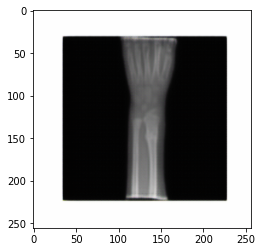

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


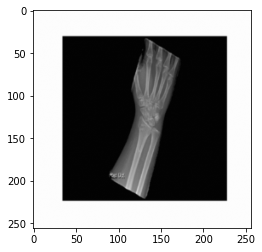

Predicted Image: 


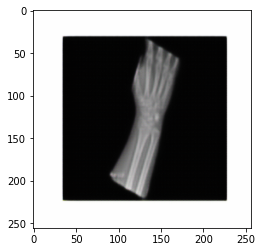

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


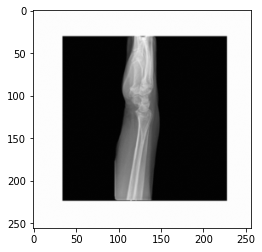

Predicted Image: 


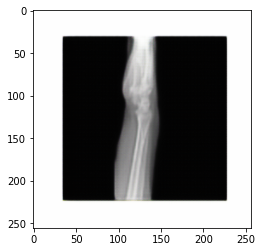

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


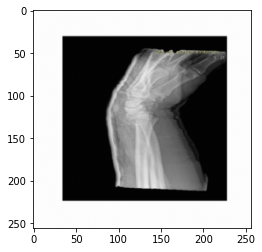

Predicted Image: 


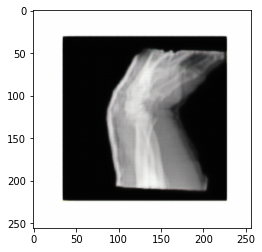

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


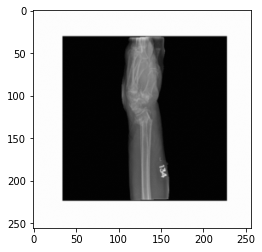

Predicted Image: 


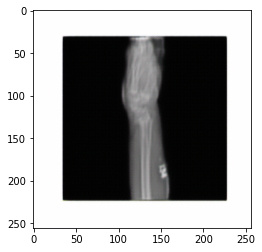

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


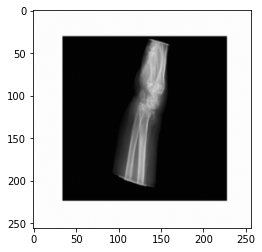

Predicted Image: 


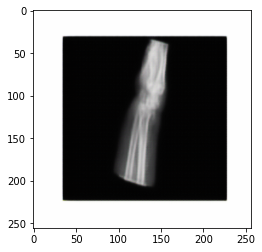

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


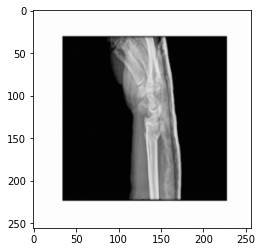

Predicted Image: 


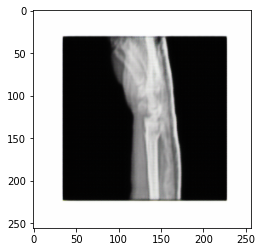

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


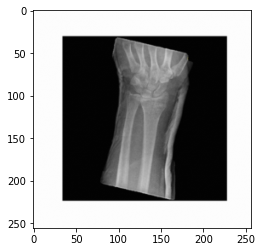

Predicted Image: 


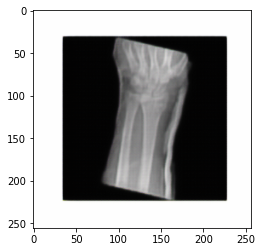

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


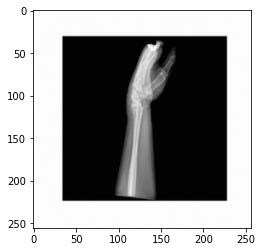

Predicted Image: 


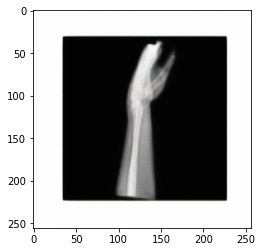

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


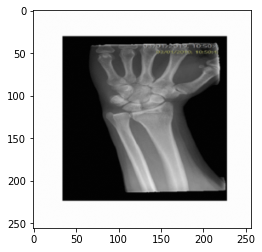

Predicted Image: 


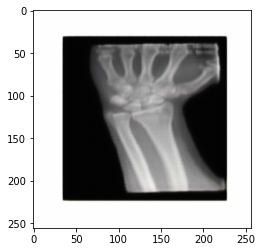

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


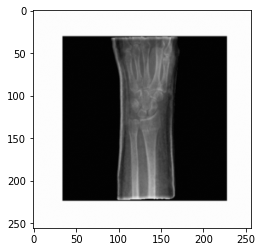

Predicted Image: 


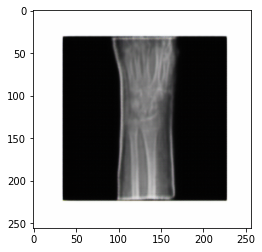

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


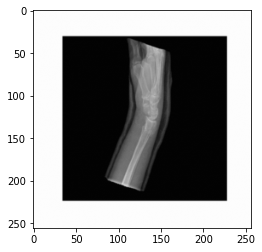

Predicted Image: 


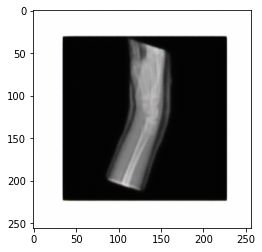

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


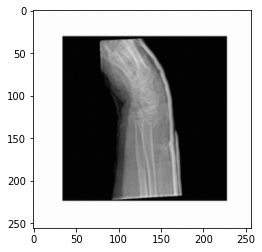

Predicted Image: 


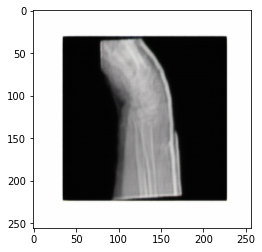

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


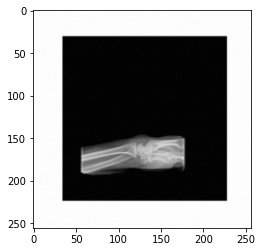

Predicted Image: 


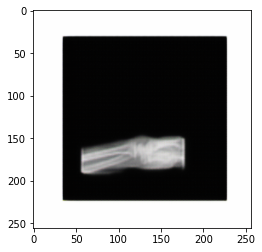

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


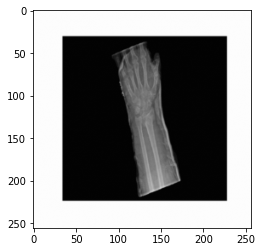

Predicted Image: 


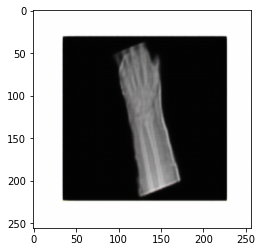

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


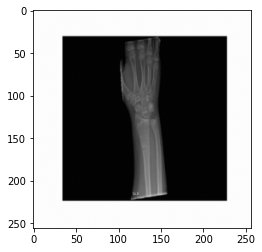

Predicted Image: 


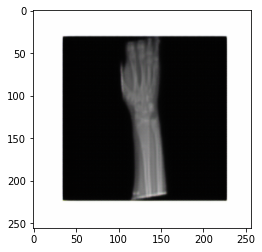

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


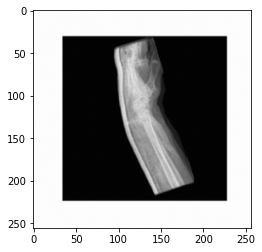

Predicted Image: 


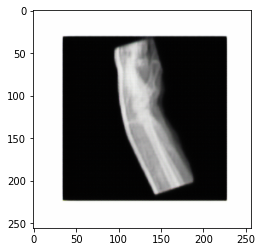

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


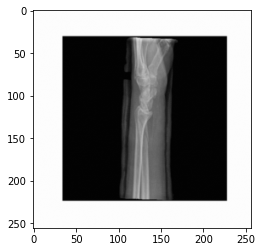

Predicted Image: 


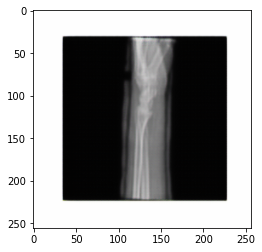

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


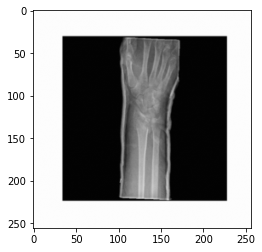

Predicted Image: 


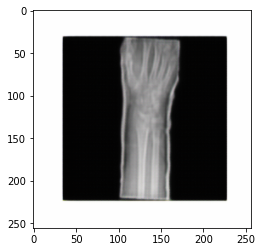

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


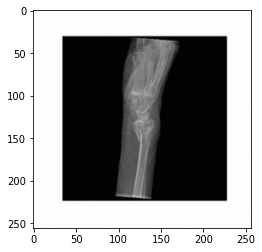

Predicted Image: 


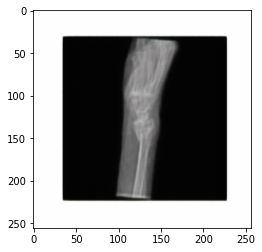

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


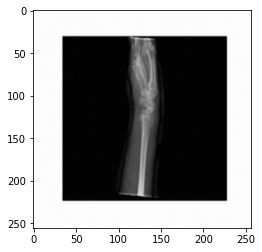

Predicted Image: 


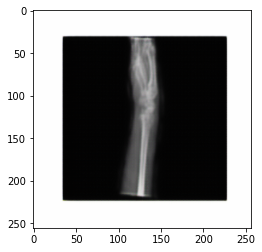

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


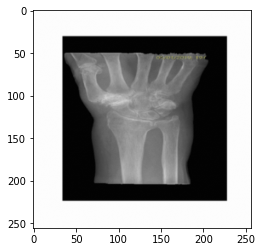

Predicted Image: 


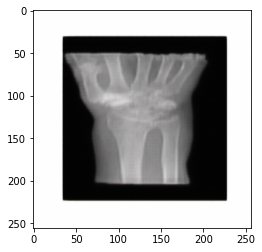

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


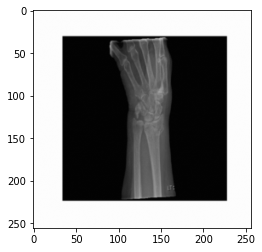

Predicted Image: 


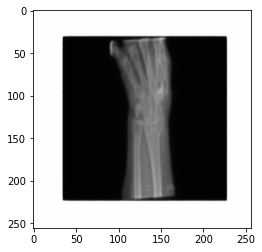

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


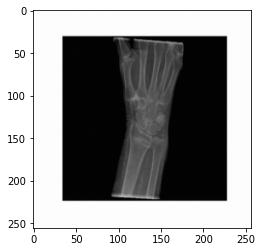

Predicted Image: 


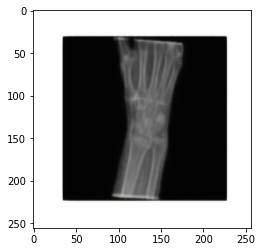

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


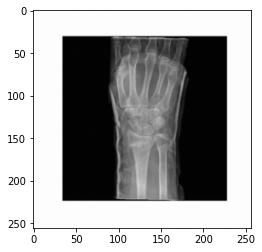

Predicted Image: 


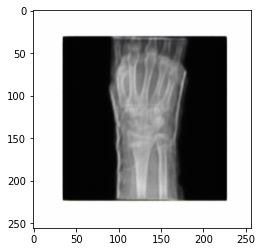

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


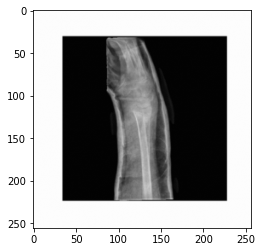

Predicted Image: 


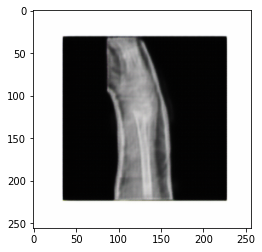

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


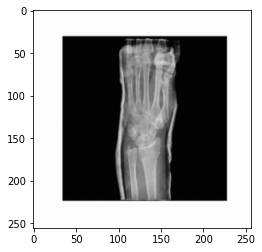

Predicted Image: 


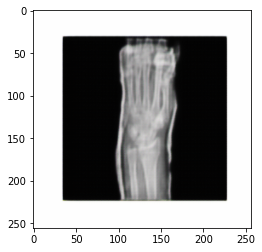

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


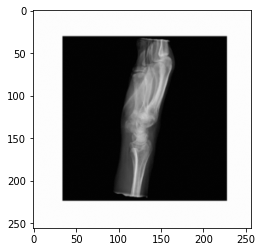

Predicted Image: 


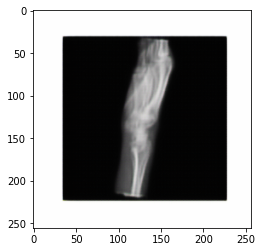

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


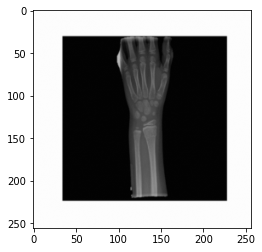

Predicted Image: 


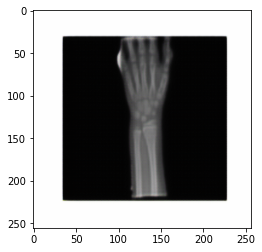

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


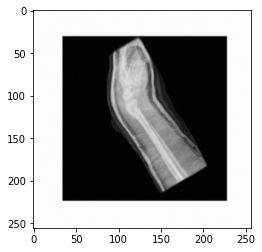

Predicted Image: 


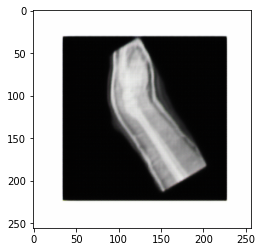

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


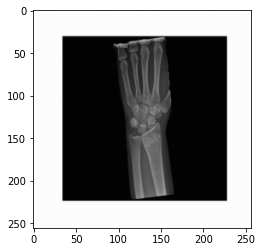

Predicted Image: 


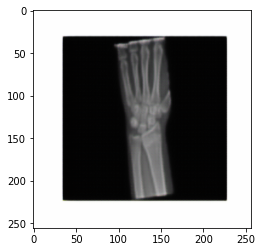

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


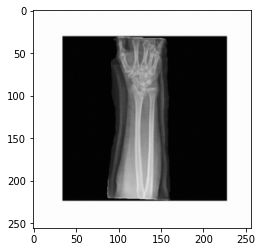

Predicted Image: 


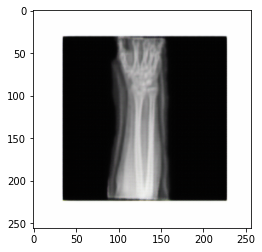

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


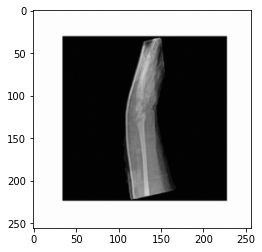

Predicted Image: 


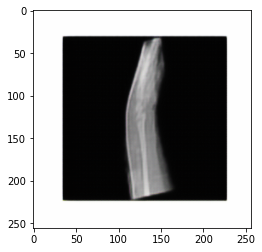

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


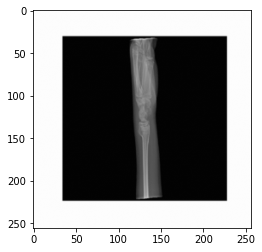

Predicted Image: 


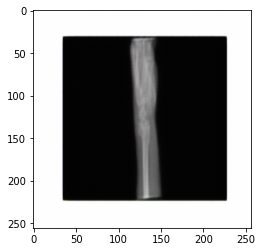

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


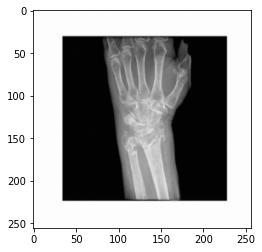

Predicted Image: 


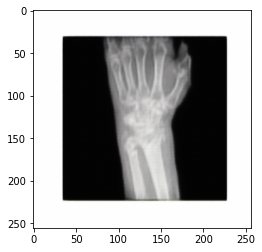

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


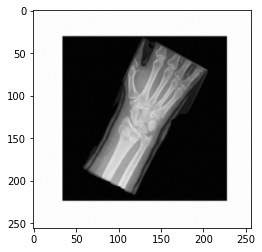

Predicted Image: 


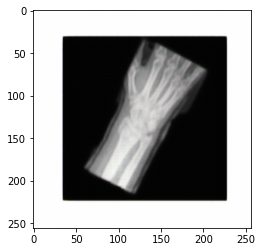

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


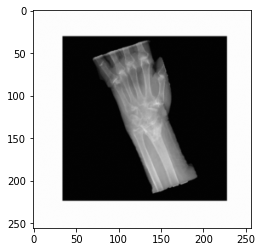

Predicted Image: 


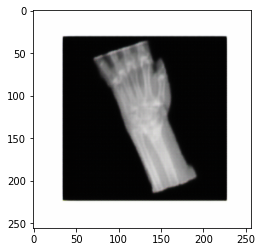

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


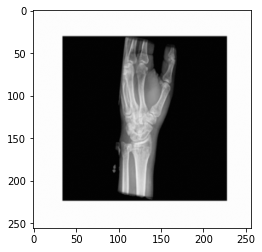

Predicted Image: 


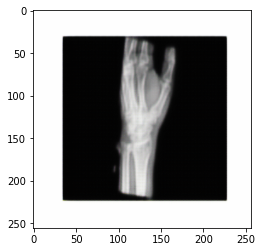

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


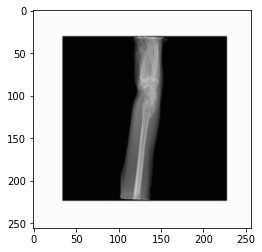

Predicted Image: 


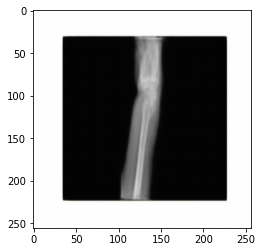

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


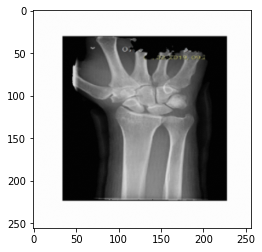

Predicted Image: 


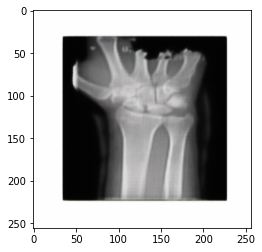

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


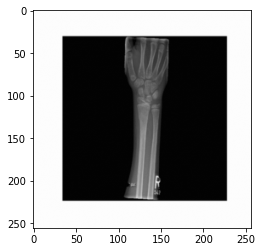

Predicted Image: 


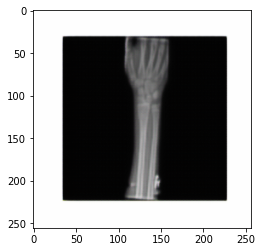

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


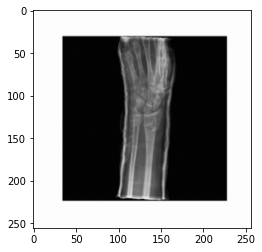

Predicted Image: 


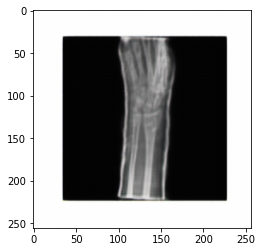

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


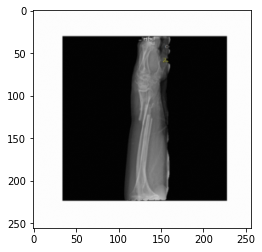

Predicted Image: 


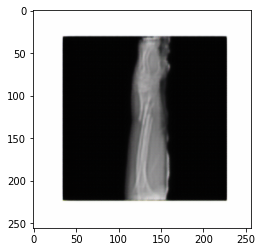

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


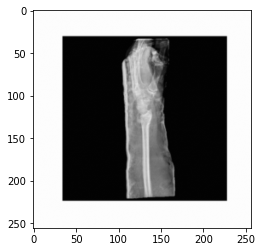

Predicted Image: 


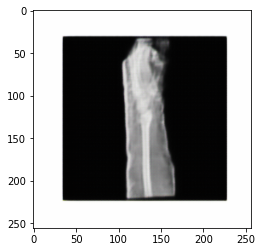

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


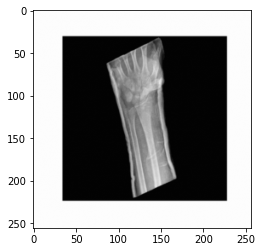

Predicted Image: 


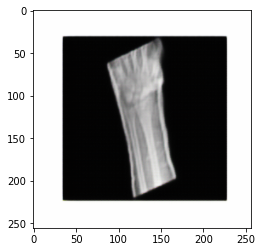

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


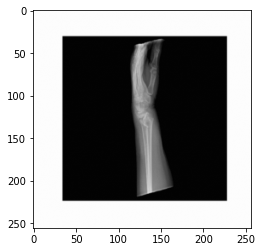

Predicted Image: 


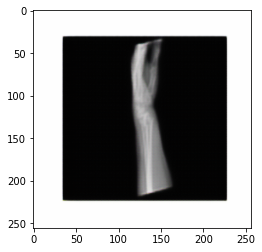

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


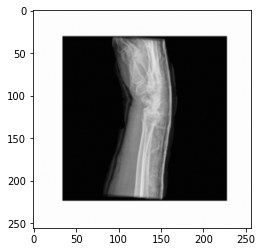

Predicted Image: 


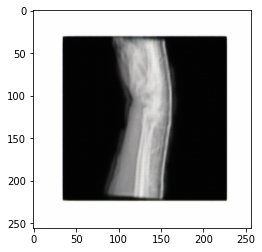

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


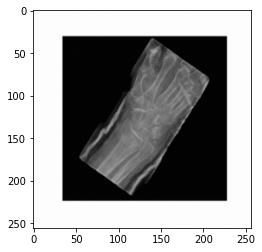

Predicted Image: 


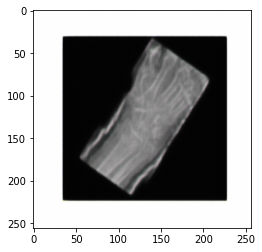

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


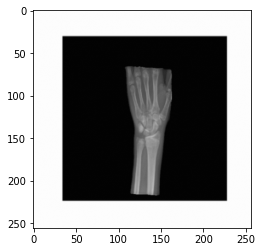

Predicted Image: 


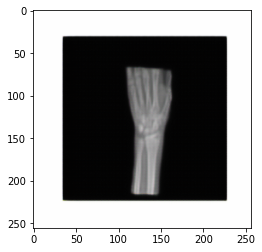

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


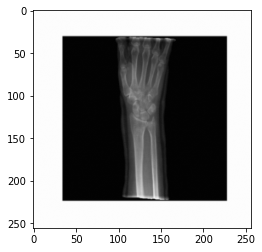

Predicted Image: 


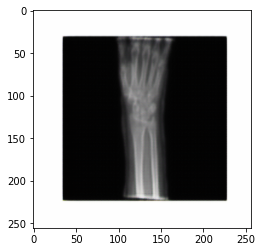

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


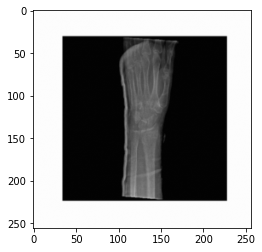

Predicted Image: 


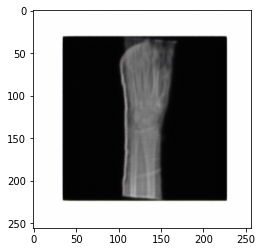

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


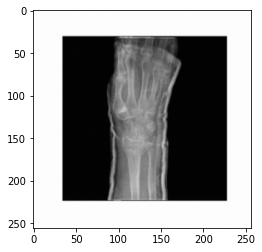

Predicted Image: 


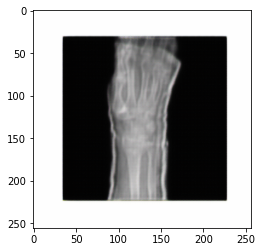

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


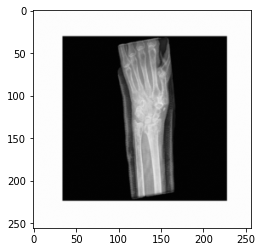

Predicted Image: 


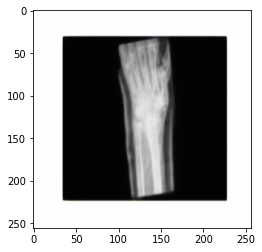

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


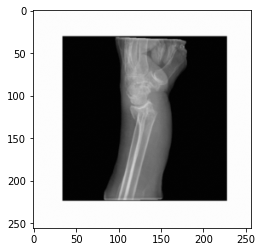

Predicted Image: 


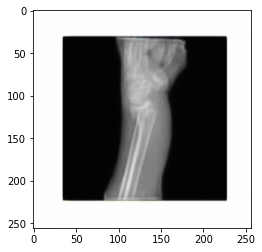

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


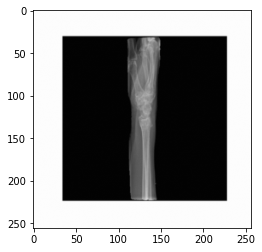

Predicted Image: 


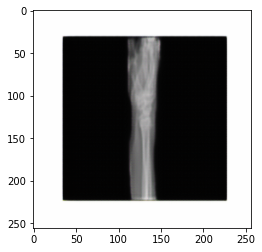

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


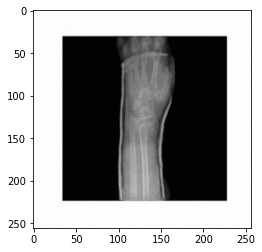

Predicted Image: 


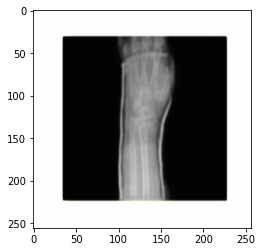

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


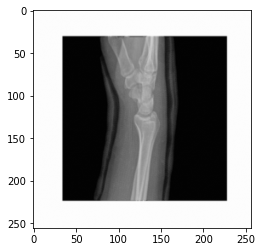

Predicted Image: 


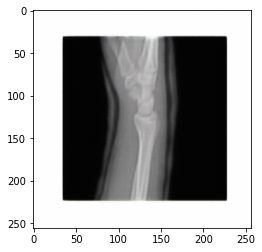

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


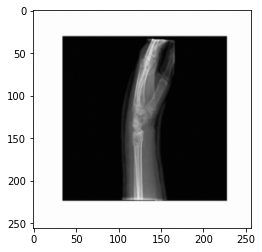

Predicted Image: 


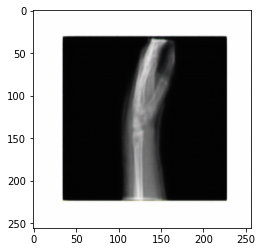

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


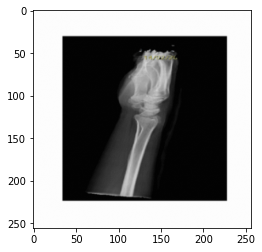

Predicted Image: 


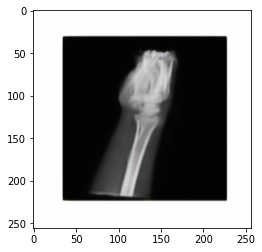

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


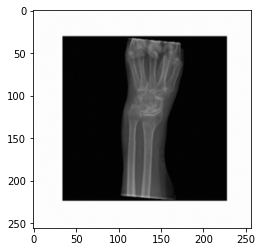

Predicted Image: 


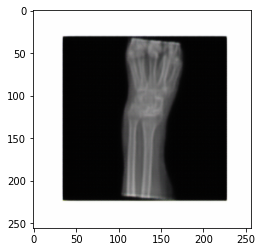

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


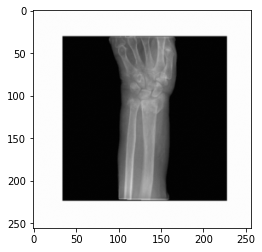

Predicted Image: 


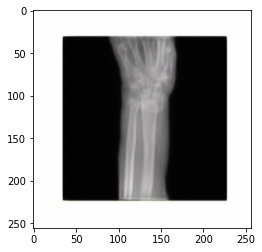

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


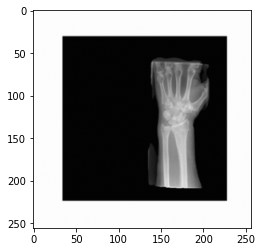

Predicted Image: 


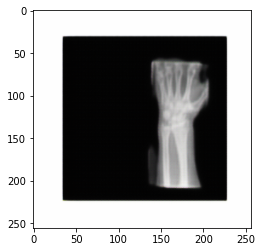

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


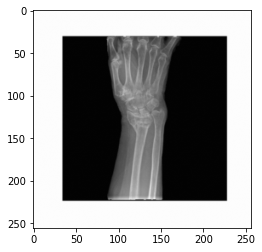

Predicted Image: 


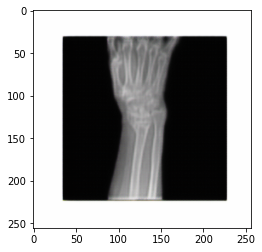

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


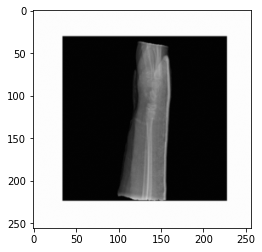

Predicted Image: 


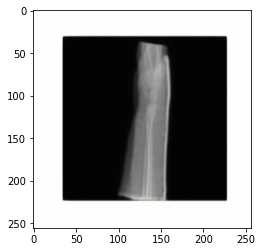

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


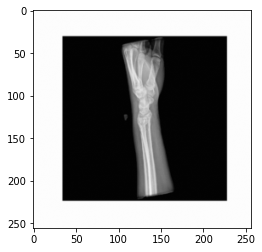

Predicted Image: 


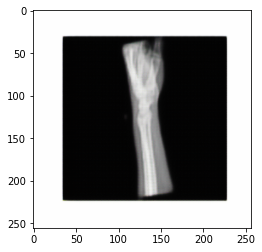

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


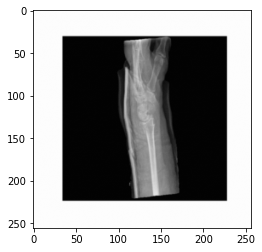

Predicted Image: 


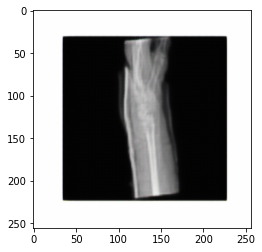

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


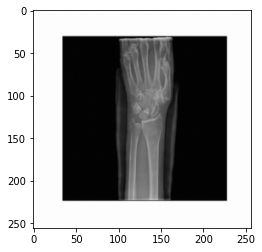

Predicted Image: 


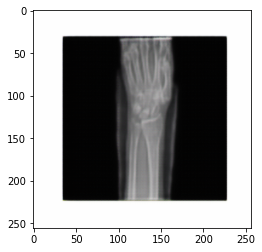

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


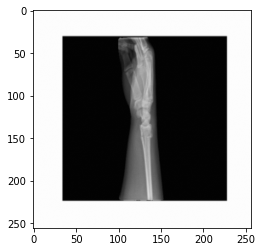

Predicted Image: 


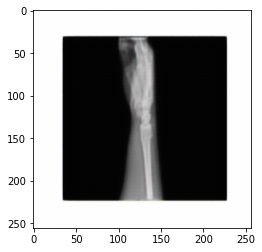

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


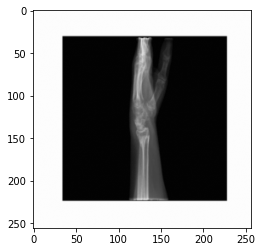

Predicted Image: 


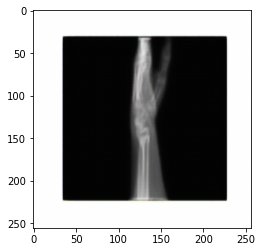

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


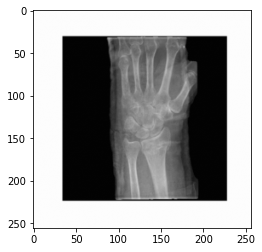

Predicted Image: 


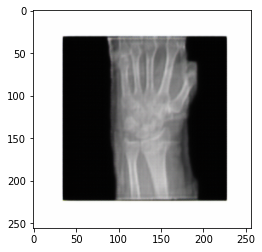

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


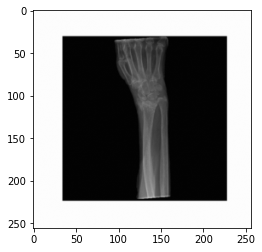

Predicted Image: 


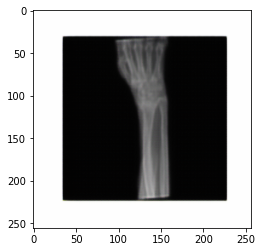

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


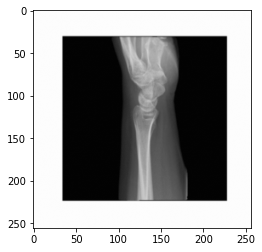

Predicted Image: 


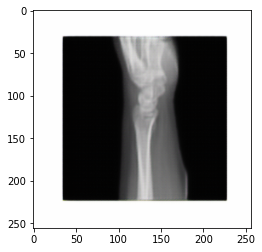

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


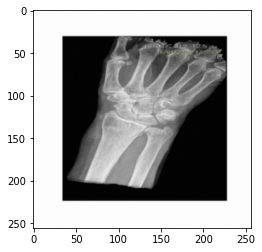

Predicted Image: 


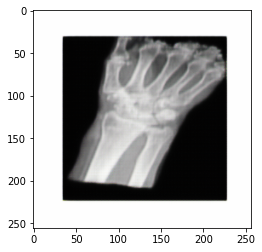

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


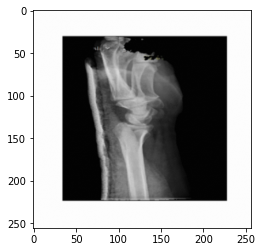

Predicted Image: 


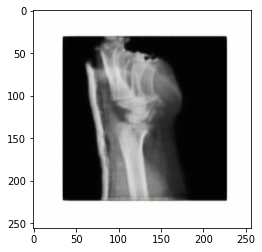

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


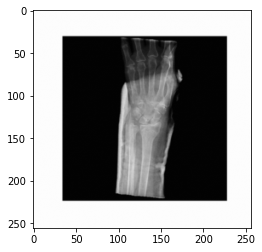

Predicted Image: 


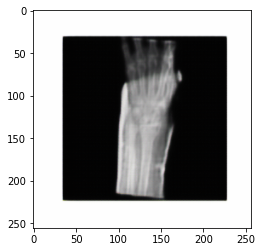

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


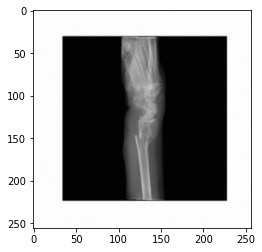

Predicted Image: 


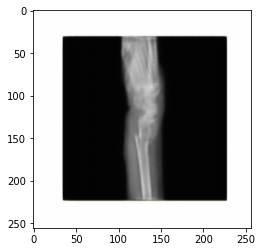

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


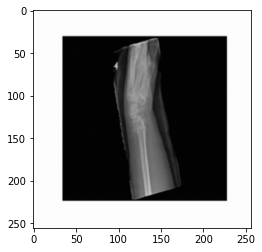

Predicted Image: 


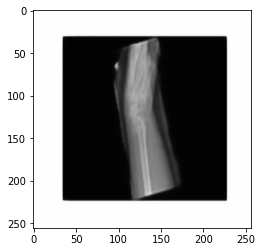

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


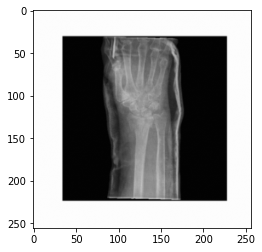

Predicted Image: 


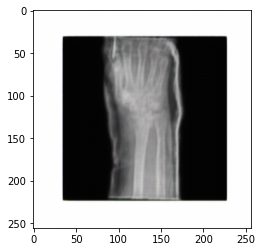

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


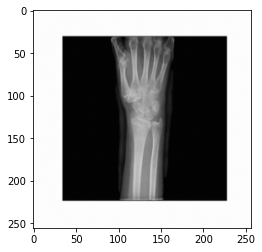

Predicted Image: 


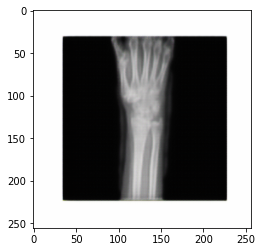

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


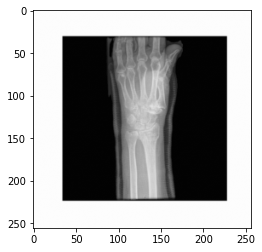

Predicted Image: 


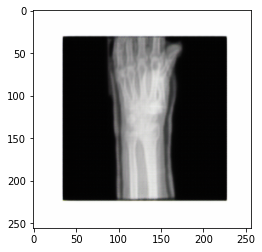

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


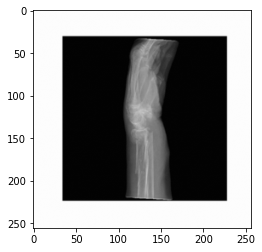

Predicted Image: 


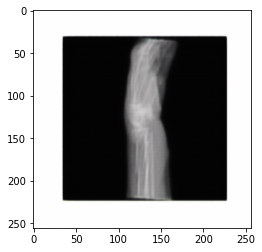

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


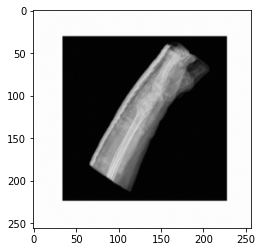

Predicted Image: 


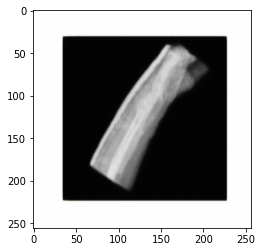

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)
Actual Image: 


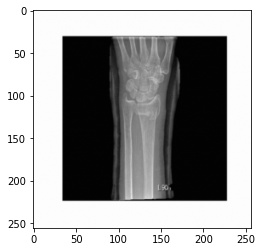

Predicted Image: 


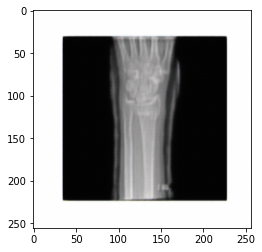

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.9467863800423445, shape=(), dtype=float64)


In [18]:
##################### Showing Positive Bone Actual and Predicted Images #####################

for i in range(X_test.shape[0]):

  print("Actual Image: ")
  plt.imshow (y_test[i])
  plt.show()
  print("Predicted Image: ")
  plt.imshow (output[i])
  plt.show()


  tmp_dice_coeff = dice_coeff (y_test, output)
  print("Dice Coefficient Values between predicted and actual Maks is: ", tmp_dice_coeff )
  
  #intersaction = np.logical_and(y_test, output)
  #union = np.logical_or(y_test, output)
  #iou_score = np.sum(intersaction) / np.sum(union)
  #print("IOU score is: ", iou_score)




In [19]:
################# Showing accuracy on Negative Bone Images ##############

os.chdir( "{}/Bone_Fracture/Negative/".format(directory_path) )
print("Showing Test Folder Images Names: ")
# !ls

################### Loading Stored Auto-Encoder Model #########################
# model_path = "{}/autoencoder.h5".format(directory_path)
# autoencoder = keras.models.load_model(model_path)

testfolder_directory = "{}/Bone_Fracture/Negative/".format(directory_path)
all_negative_bone_images_paths = glob.glob('{}/*.png'.format(testfolder_directory) )

negative_test_img_bone_array = np.zeros((len(all_negative_bone_images_paths[:100]),256,256,4))

for i, tmp_path in enumerate(all_negative_bone_images_paths[:100]):

  print("Adding {} Bone Image to Numpy Array".format ( os.path.basename(tmp_path)) )
  
  img = io.imread(tmp_path)
  img_resized = resize(img, (256,256,4))

  negative_test_img_bone_array[i] = img_resized

output_negative = autoencoder.predict(negative_test_img_bone_array)


############# Fiding the loss Between Actual Negative Bone images and Predicted Bone Images ##############
mse_loses_negative= tf.keras.metrics.mean_squared_error(negative_test_img_bone_array, output_negative)
print(mse_loses_negative.shape)
mse_loses_negative= tf.reduce_sum(mse_loses_negative, axis=-1)
mse_loses_negative= tf.reduce_sum(mse_loses_negative, axis=-1)
print("Individual Losses Between Actual Negative Bone images and Predicted Bone Images: ", mse_loses_negative)

mse_loss_threshod = 200

predicted_class_negative = mse_loses_negative <= mse_loss_threshod

actual_test_labels_negative = np.zeros(negative_test_img_bone_array.shape[0])

from sklearn.metrics import accuracy_score

model_accuracy = accuracy_score(actual_test_labels_negative, predicted_class_negative)
print("Auto-Encoder Model Accuracy on Test Negative Bone Images is : ", model_accuracy, " OR ", model_accuracy*100, "%" )



Showing Test Folder Images Names: 
Adding image (2820).png Bone Image to Numpy Array
Adding image (2294).png Bone Image to Numpy Array
Adding image (3928).png Bone Image to Numpy Array
Adding image (3250).png Bone Image to Numpy Array
Adding image (3869).png Bone Image to Numpy Array
Adding image (2988).png Bone Image to Numpy Array
Adding image (3088).png Bone Image to Numpy Array
Adding image (2943).png Bone Image to Numpy Array
Adding image (3252).png Bone Image to Numpy Array
Adding image (3011).png Bone Image to Numpy Array
Adding image (3083).png Bone Image to Numpy Array
Adding image (624).png Bone Image to Numpy Array
Adding image (3796).png Bone Image to Numpy Array
Adding image (2519).png Bone Image to Numpy Array
Adding image (2705).png Bone Image to Numpy Array
Adding image (3169).png Bone Image to Numpy Array
Adding image (2306).png Bone Image to Numpy Array
Adding image (2468).png Bone Image to Numpy Array
Adding image (3192).png Bone Image to Numpy Array
Adding image (29

Actual Image: 


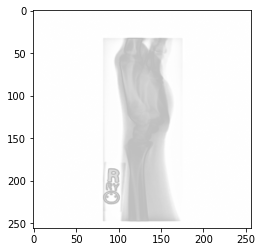

Predicted Image: 


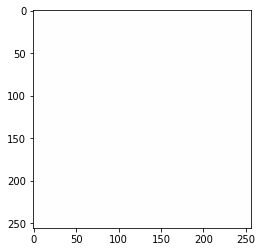

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


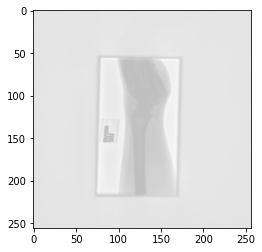

Predicted Image: 


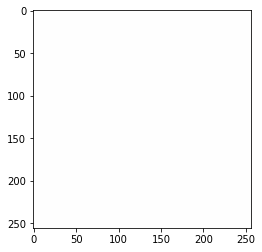

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


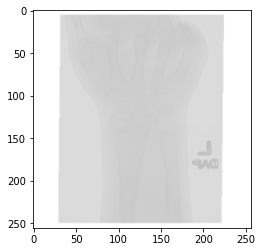

Predicted Image: 


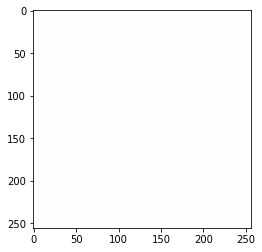

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


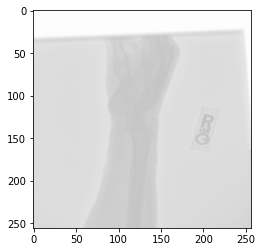

Predicted Image: 


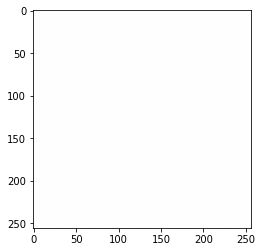

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


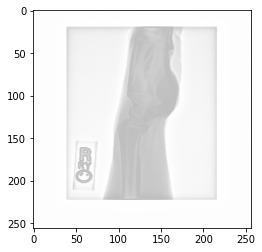

Predicted Image: 


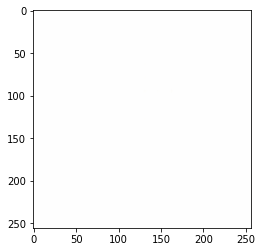

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


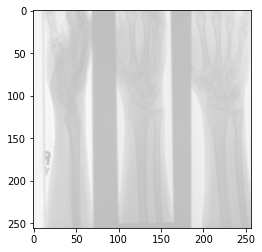

Predicted Image: 


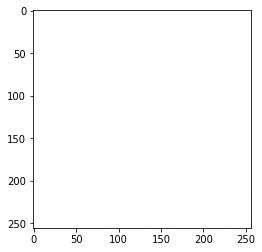

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


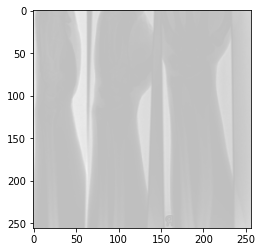

Predicted Image: 


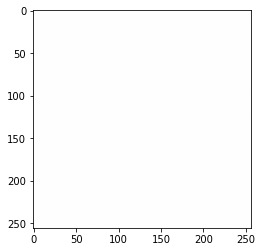

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


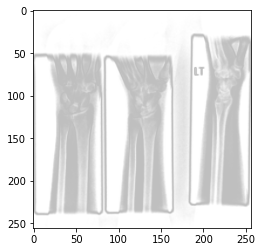

Predicted Image: 


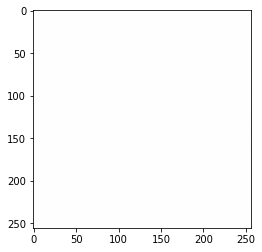

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


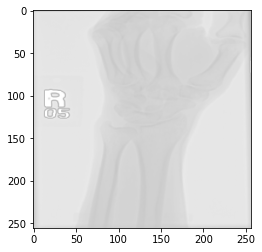

Predicted Image: 


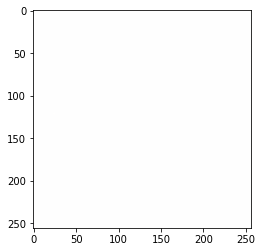

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


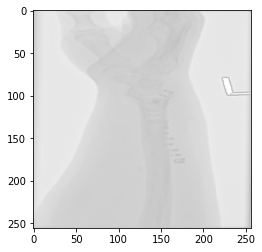

Predicted Image: 


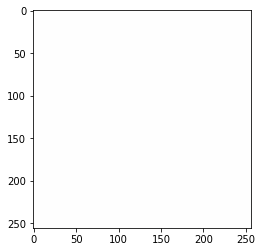

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


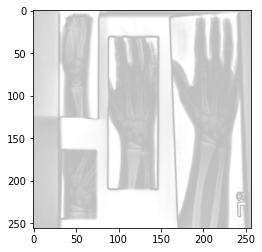

Predicted Image: 


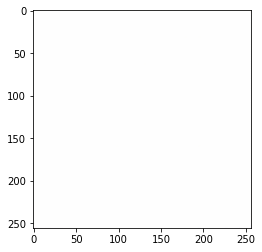

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


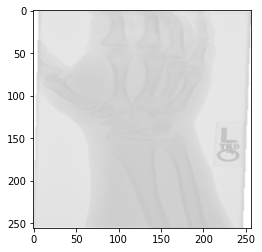

Predicted Image: 


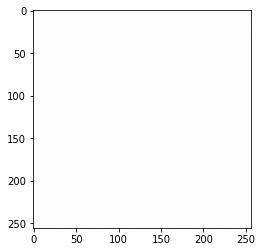

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


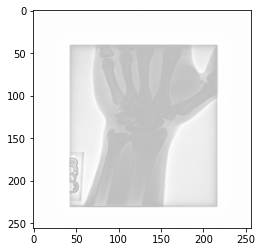

Predicted Image: 


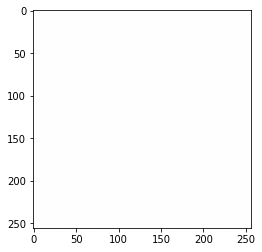

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


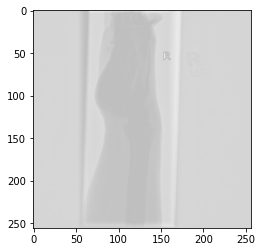

Predicted Image: 


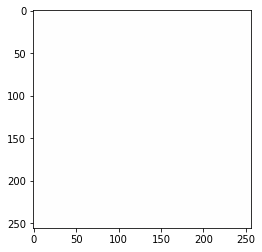

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


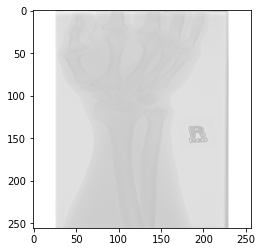

Predicted Image: 


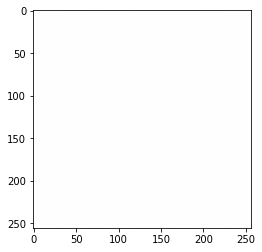

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


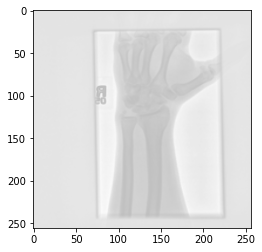

Predicted Image: 


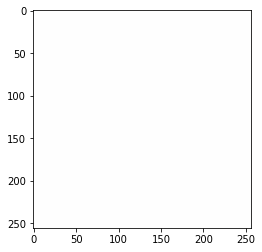

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


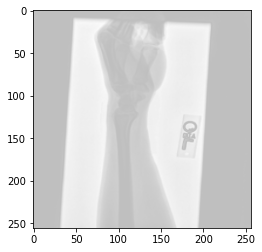

Predicted Image: 


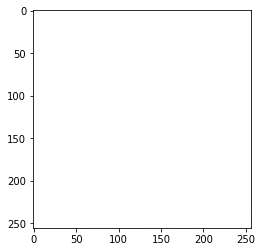

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


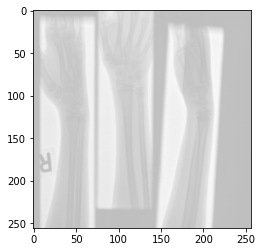

Predicted Image: 


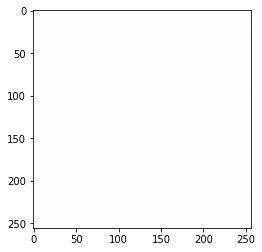

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


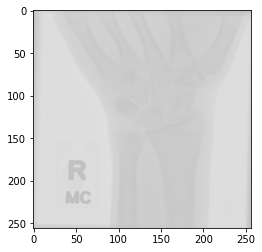

Predicted Image: 


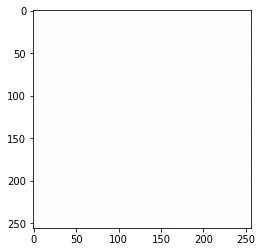

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


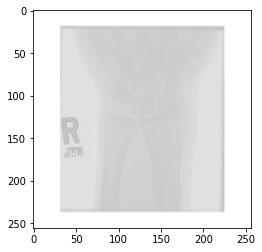

Predicted Image: 


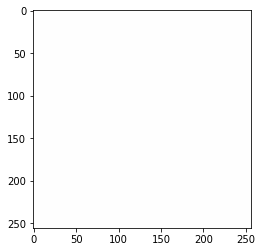

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


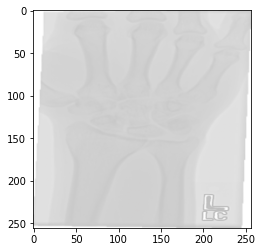

Predicted Image: 


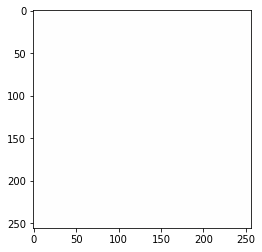

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


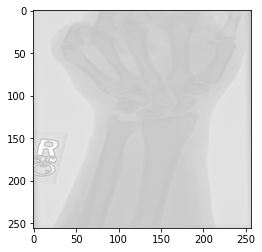

Predicted Image: 


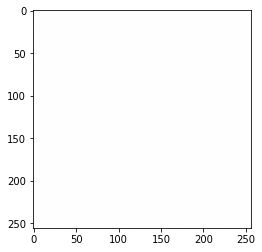

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


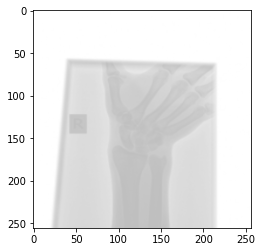

Predicted Image: 


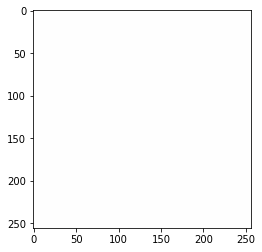

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


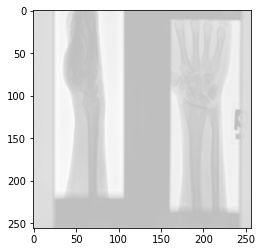

Predicted Image: 


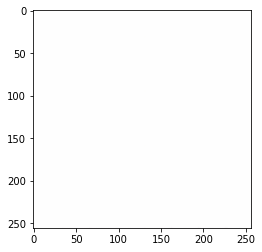

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


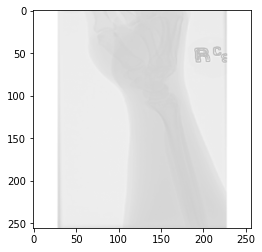

Predicted Image: 


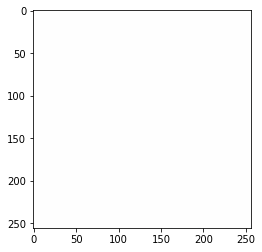

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


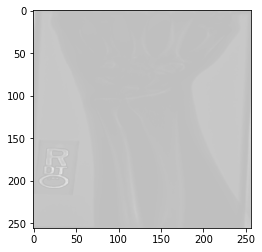

Predicted Image: 


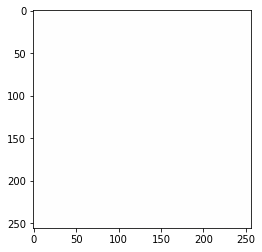

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


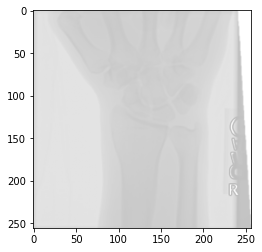

Predicted Image: 


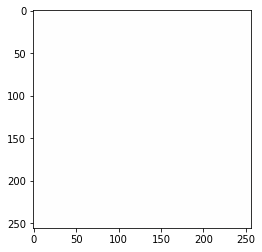

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


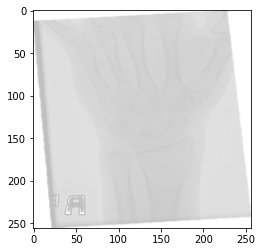

Predicted Image: 


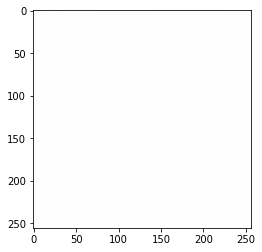

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


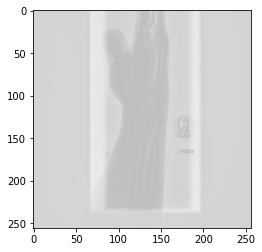

Predicted Image: 


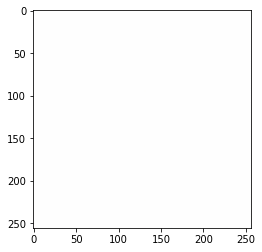

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


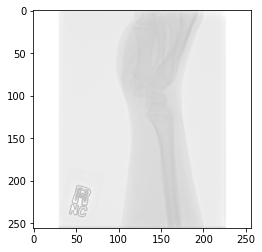

Predicted Image: 


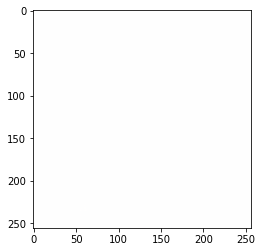

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


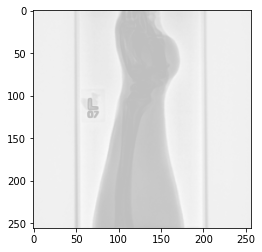

Predicted Image: 


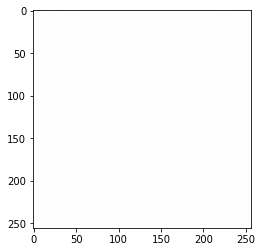

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


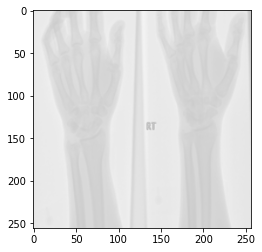

Predicted Image: 


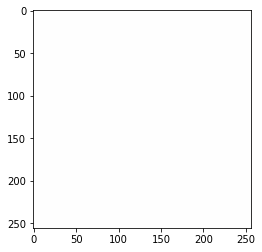

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


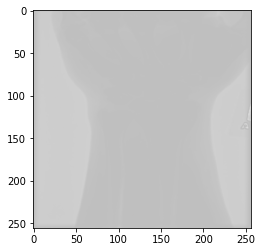

Predicted Image: 


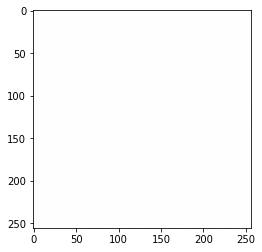

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


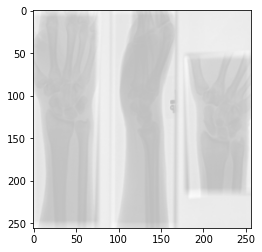

Predicted Image: 


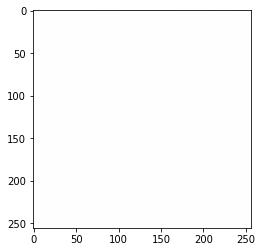

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


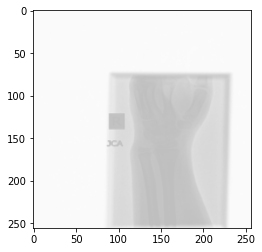

Predicted Image: 


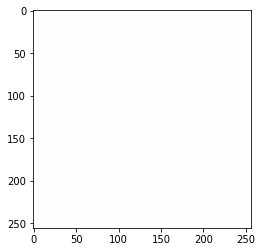

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


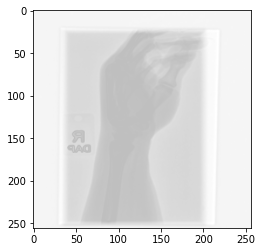

Predicted Image: 


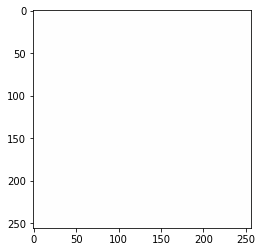

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


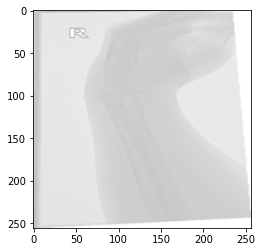

Predicted Image: 


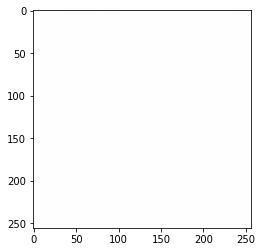

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


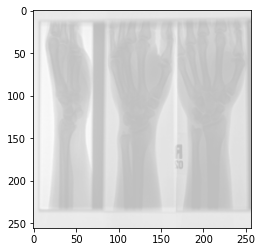

Predicted Image: 


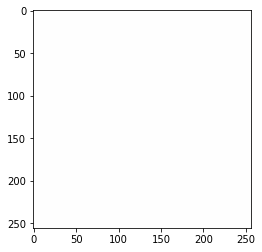

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


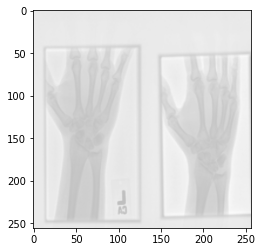

Predicted Image: 


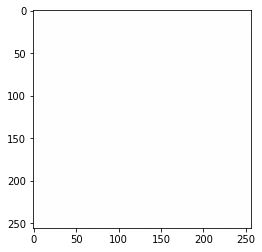

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


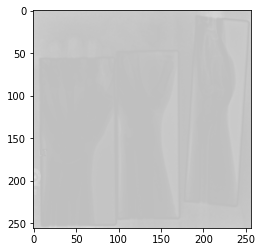

Predicted Image: 


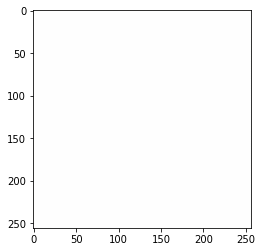

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


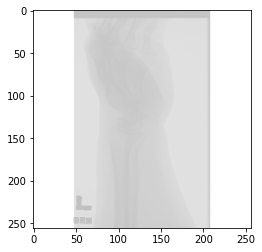

Predicted Image: 


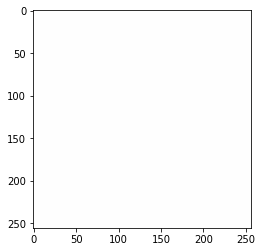

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


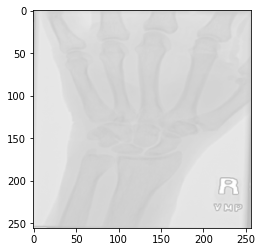

Predicted Image: 


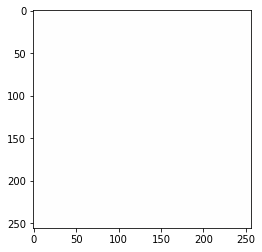

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


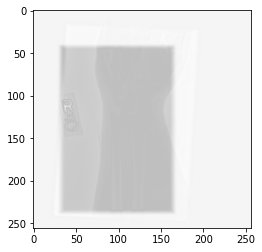

Predicted Image: 


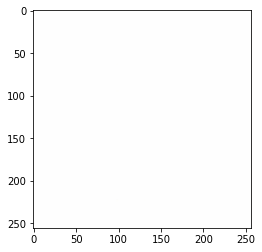

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


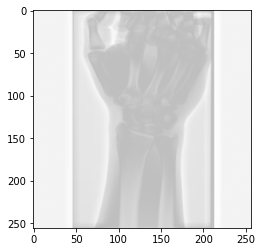

Predicted Image: 


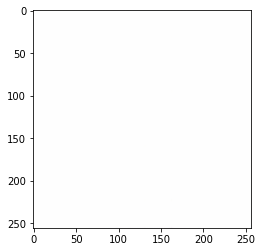

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


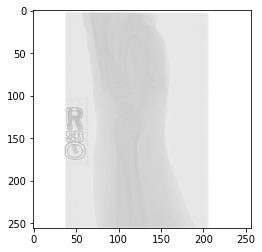

Predicted Image: 


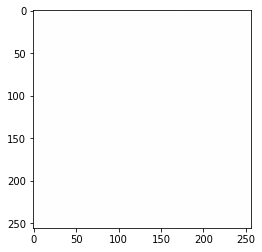

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


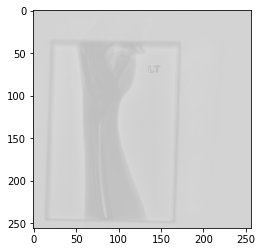

Predicted Image: 


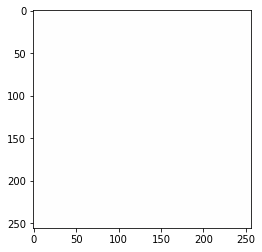

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


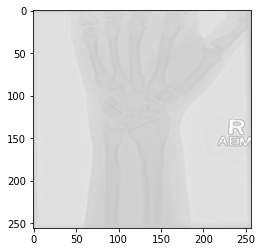

Predicted Image: 


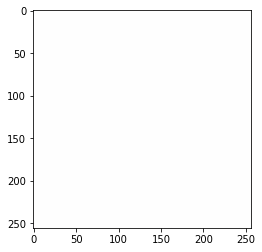

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


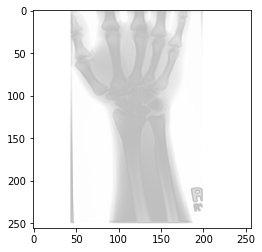

Predicted Image: 


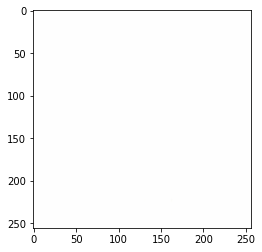

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


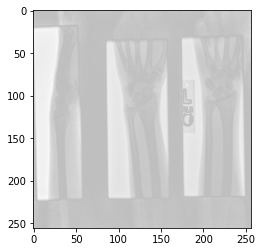

Predicted Image: 


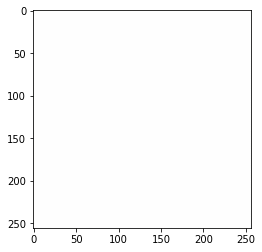

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


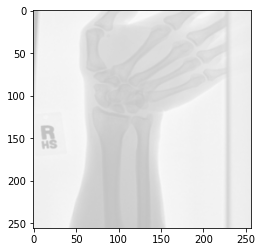

Predicted Image: 


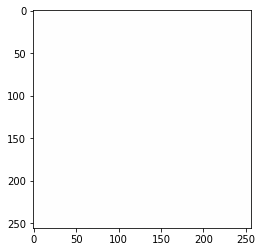

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


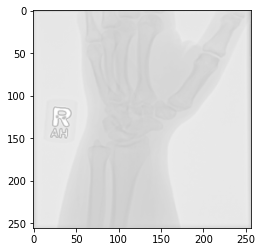

Predicted Image: 


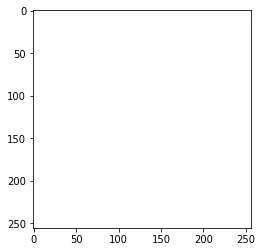

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


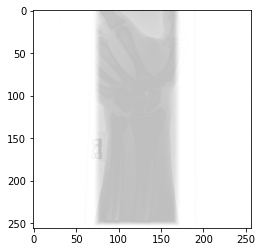

Predicted Image: 


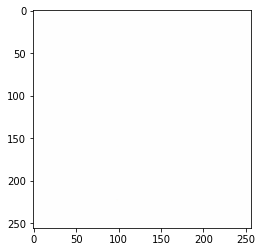

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


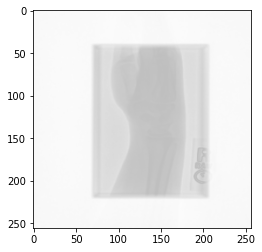

Predicted Image: 


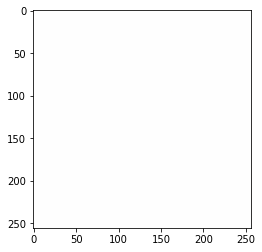

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


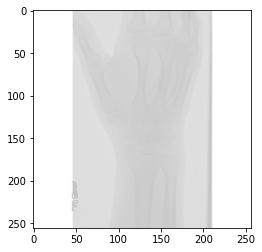

Predicted Image: 


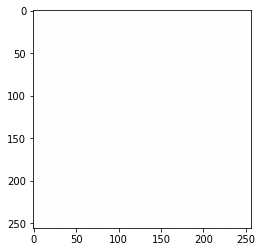

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


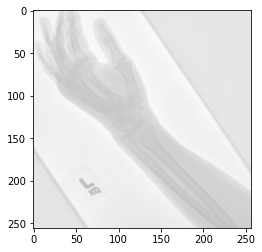

Predicted Image: 


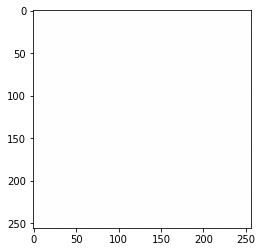

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


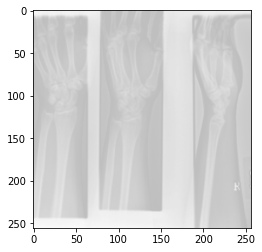

Predicted Image: 


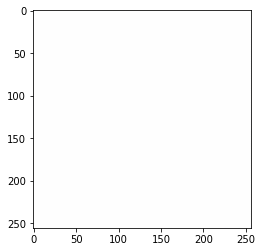

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


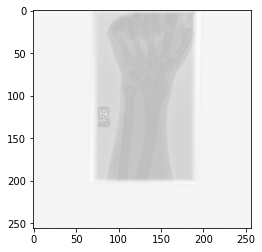

Predicted Image: 


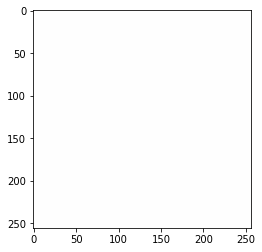

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


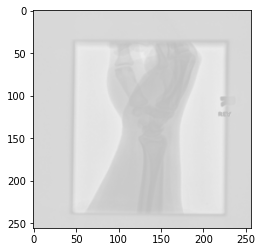

Predicted Image: 


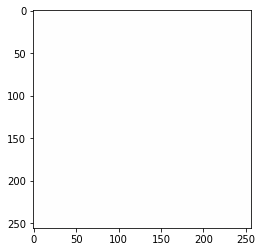

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


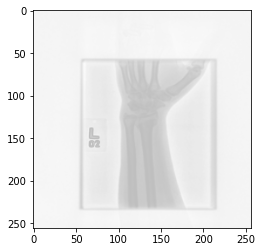

Predicted Image: 


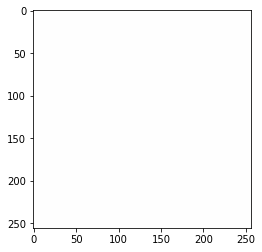

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


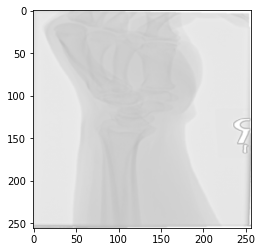

Predicted Image: 


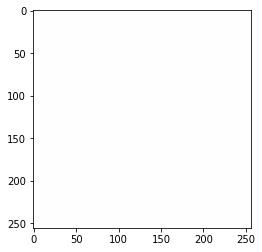

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


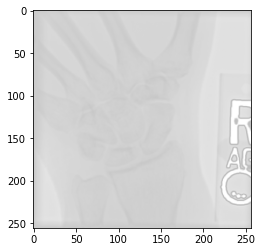

Predicted Image: 


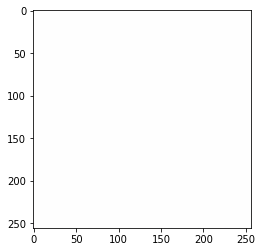

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


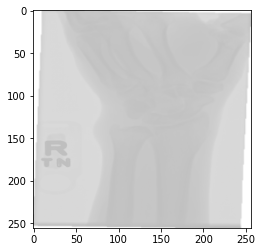

Predicted Image: 


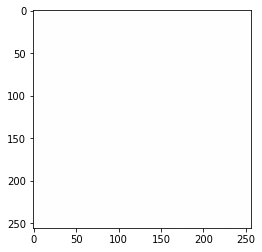

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


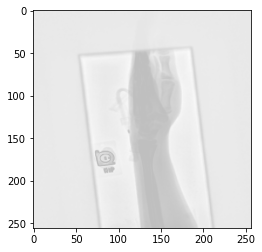

Predicted Image: 


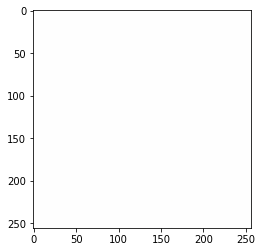

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


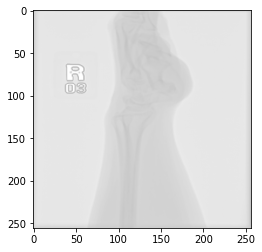

Predicted Image: 


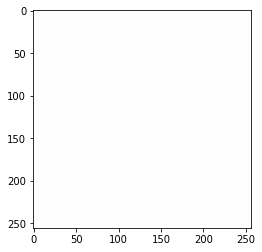

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


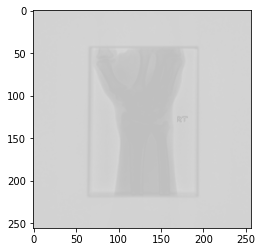

Predicted Image: 


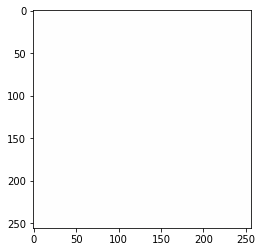

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


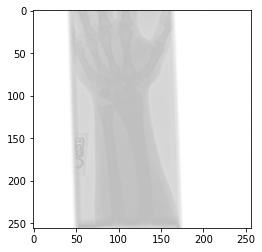

Predicted Image: 


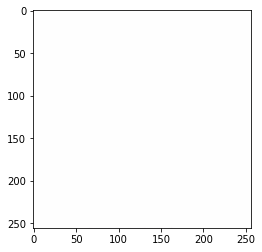

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


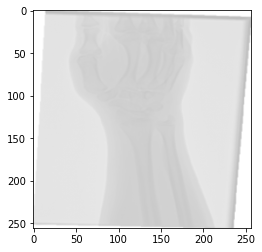

Predicted Image: 


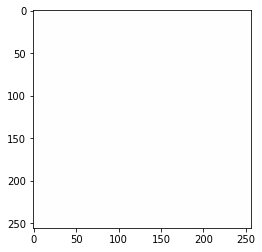

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


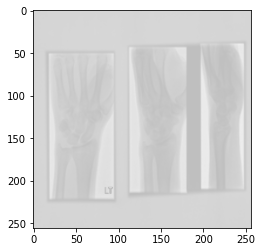

Predicted Image: 


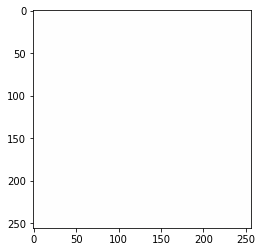

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


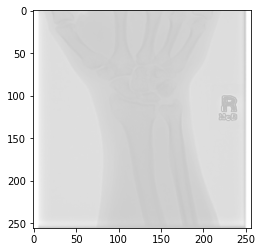

Predicted Image: 


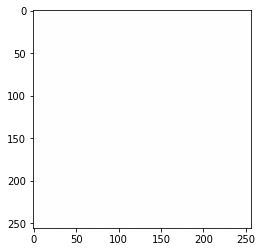

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


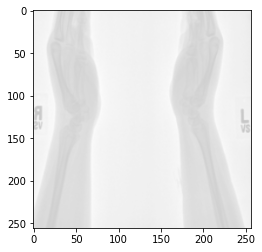

Predicted Image: 


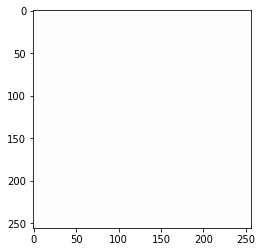

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


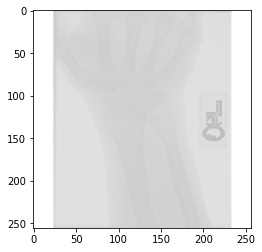

Predicted Image: 


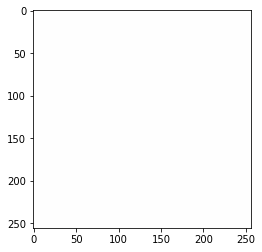

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


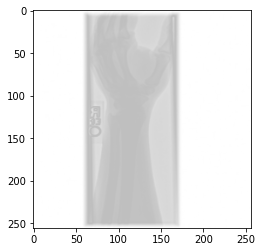

Predicted Image: 


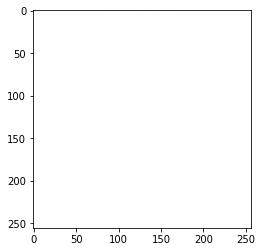

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


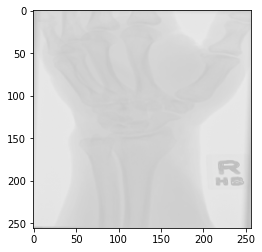

Predicted Image: 


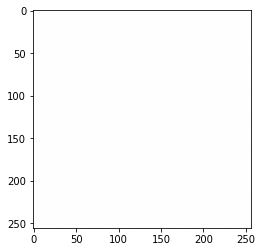

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


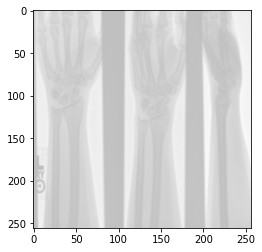

Predicted Image: 


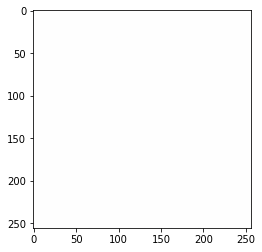

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


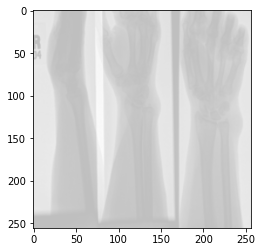

Predicted Image: 


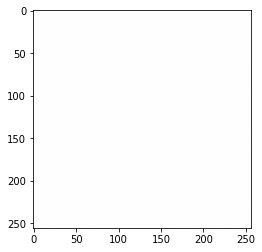

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


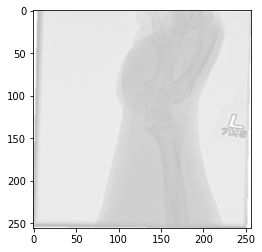

Predicted Image: 


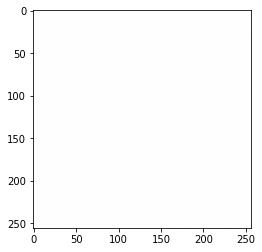

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


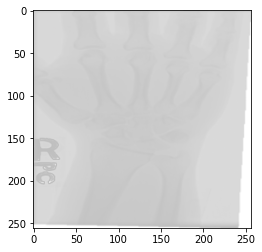

Predicted Image: 


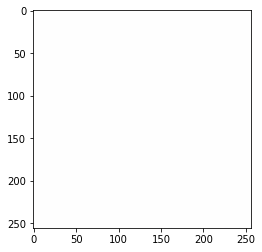

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


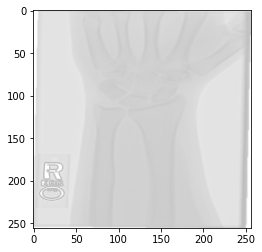

Predicted Image: 


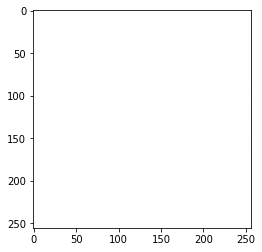

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


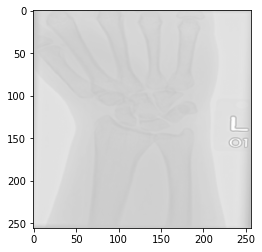

Predicted Image: 


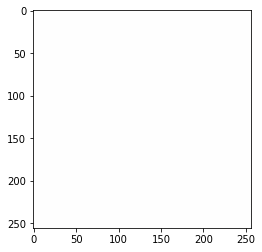

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


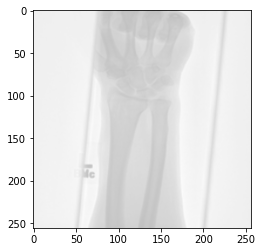

Predicted Image: 


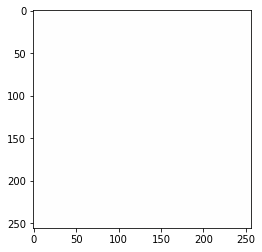

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


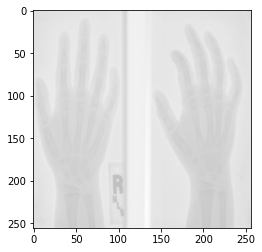

Predicted Image: 


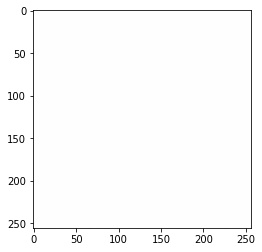

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


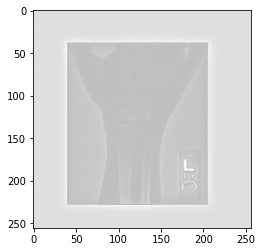

Predicted Image: 


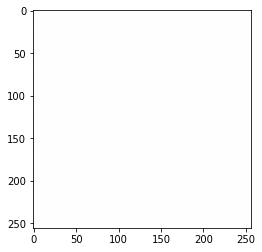

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


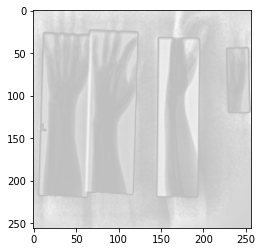

Predicted Image: 


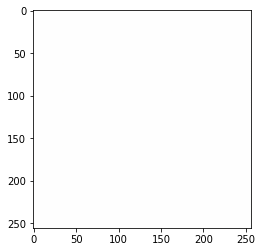

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


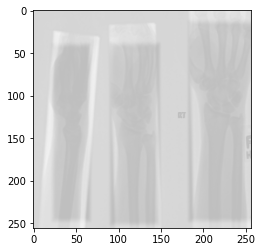

Predicted Image: 


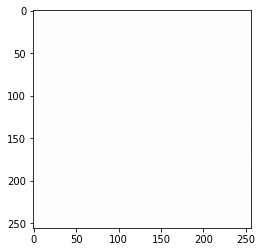

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


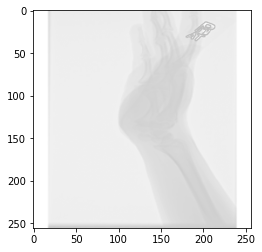

Predicted Image: 


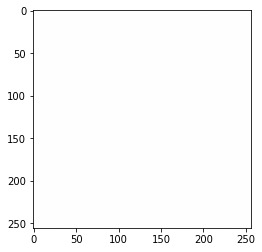

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


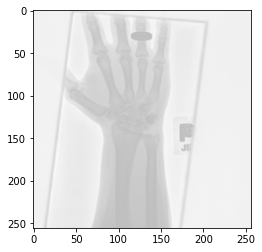

Predicted Image: 


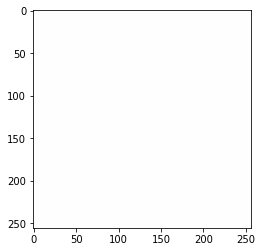

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


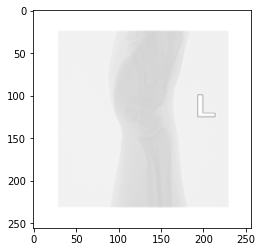

Predicted Image: 


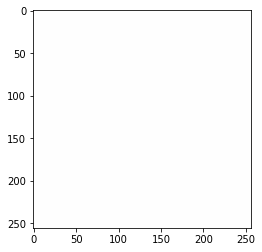

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


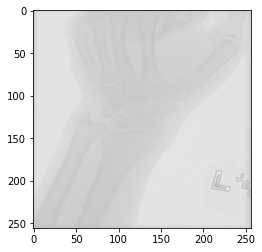

Predicted Image: 


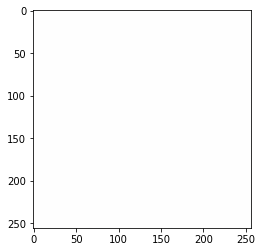

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


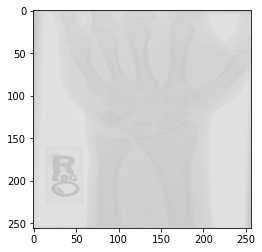

Predicted Image: 


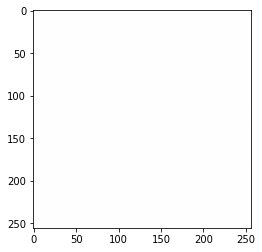

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


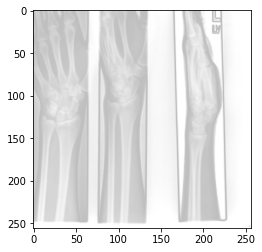

Predicted Image: 


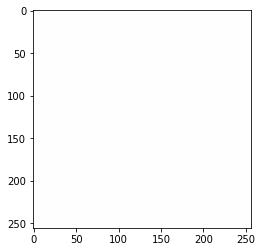

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


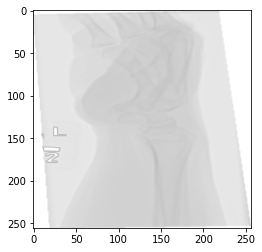

Predicted Image: 


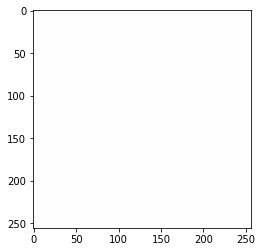

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


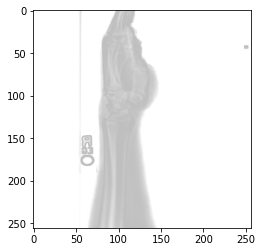

Predicted Image: 


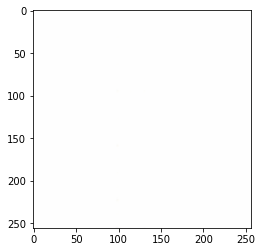

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


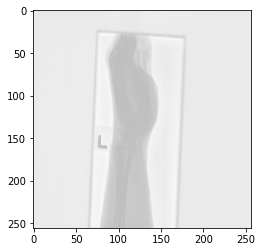

Predicted Image: 


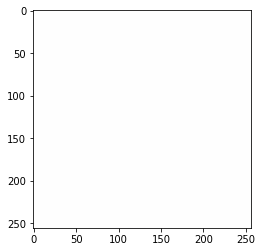

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


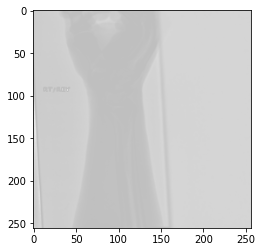

Predicted Image: 


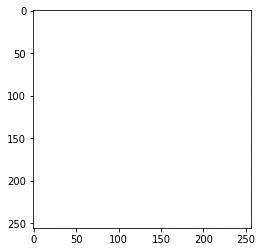

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


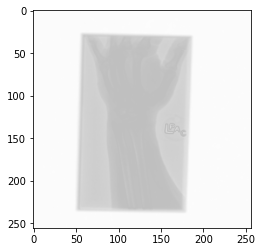

Predicted Image: 


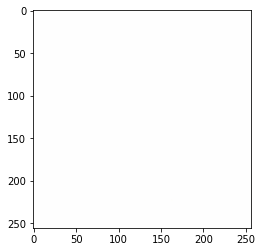

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


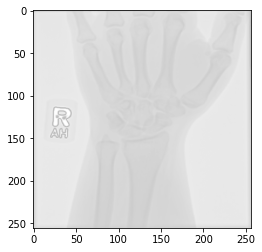

Predicted Image: 


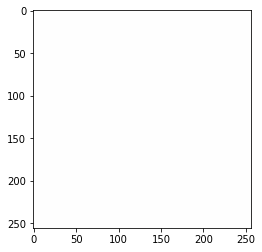

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


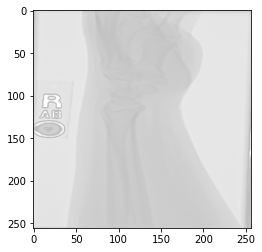

Predicted Image: 


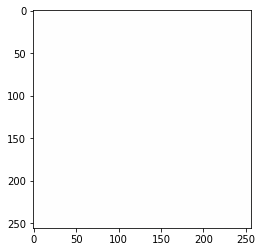

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


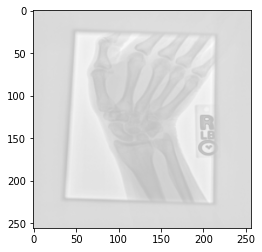

Predicted Image: 


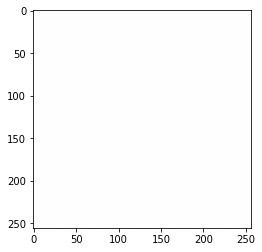

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


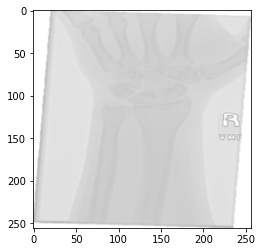

Predicted Image: 


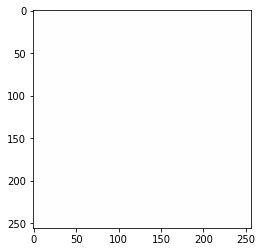

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)
Actual Image: 


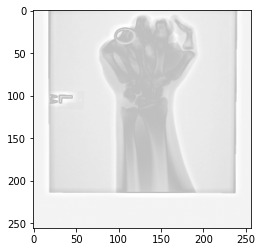

Predicted Image: 


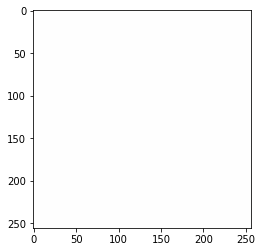

Dice Coefficient Values between predicted and actual Maks is:  tf.Tensor(0.3619834338965619, shape=(), dtype=float64)


In [20]:
##################### Showing Negative Bone Actual and Predicted Images #####################

for i in range(negative_test_img_bone_array.shape[0]):

  print("Actual Image: ")
  plt.imshow (negative_test_img_bone_array[i])
  plt.show()
  print("Predicted Image: ")
  plt.imshow (output_negative[i])
  plt.show()

  tmp_dice_coeff = dice_coeff (negative_test_img_bone_array, output_negative)
  print("Dice Coefficient Values between predicted and actual Maks is: ", tmp_dice_coeff )
  
  #intersaction = np.logical_and(negative_test_img_bone_array, output_negative)
  #union = np.logical_or(negative_test_img_bone_array, output_negative)
  #iou_score = np.sum(intersaction) / np.sum(union)
  #print("IOU score is: ", iou_score)



Total Number of Test Images are :  99


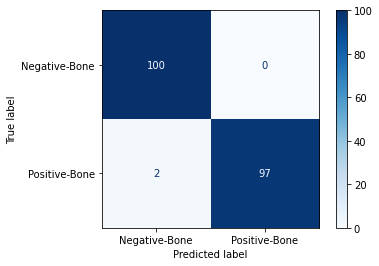

In [21]:
####################### Showing Visualizations of Confusion Matrix ########################
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

print("Total Number of Test Images are : ", len(actual_test_labels))
labels = ["Negative-Bone", "Positive-Bone"]

all_test_labels = np.concatenate([actual_test_labels,actual_test_labels_negative], axis=-1)
all_predicted_classes = np.concatenate([predicted_class ,predicted_class_negative], axis=-1)

cm = confusion_matrix(all_test_labels, all_predicted_classes)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)

disp.plot(cmap=plt.cm.Blues)
plt.show()


Showing Predicted Probabilities: 
[  1.           1.           1.           1.           1.
   1.           1.           1.           1.           1.
   1.           1.           1.           1.           1.
   1.           1.           1.           1.           1.
   1.           1.           1.           1.           1.
   1.           1.           1.           1.           1.
   1.           1.           1.           1.           1.
   1.           1.           1.           1.           1.
   1.           1.           1.           1.           1.
   1.           1.           1.           1.           1.
   1.           1.           1.           1.           1.
   0.97348493   1.           1.           1.           1.
   1.           1.           1.           1.           1.
   1.           1.           1.           1.           1.
   1.           1.           1.           1.           1.
   1.           1.           1.           1.           1.
   1.           1.           1.       

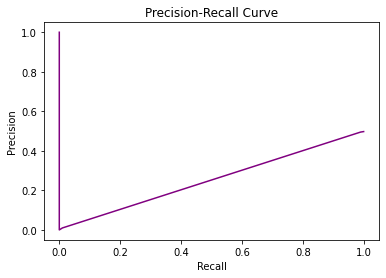

Showing Precision: 
0.9901960784313726
Showing Recall: 
0.9898989898989898
Showing F1 Score : 
0.9899474641341686


In [22]:
############################  Showing Precision, Recall , F1-Score and ROC curve ####################
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report, confusion_matrix

all_mse = np.concatenate([mse_loses, mse_loses_negative], axis=-1)

mse_losses_numpy = all_mse
mse_losses_numpy [all_predicted_classes] = 1.0
mse_losses_numpy [~all_predicted_classes] = (mse_losses_numpy [~all_predicted_classes]) / 100 
print("Showing Predicted Probabilities: ")
print(mse_losses_numpy)


from sklearn.metrics import precision_recall_curve

#calculate precision and recall
precision, recall, thresholds = precision_recall_curve(all_test_labels, mse_losses_numpy)

#create precision recall curve
fig, ax = plt.subplots()
ax.plot(recall, precision, color='purple')

#add axis labels to plot
ax.set_title('Precision-Recall Curve')
ax.set_ylabel('Precision')
ax.set_xlabel('Recall')

#display plot
plt.show()


print("Showing Precision: ")
print(precision_score(all_test_labels, all_predicted_classes, average="macro"))
print("Showing Recall: ")
print(recall_score(all_test_labels, all_predicted_classes, average="macro"))    
print("Showing F1 Score : ")
print(f1_score(all_test_labels, all_predicted_classes, average="macro"))